In [ ]:
from sklearn.model_selection import train_test_split
from imblearn.ensemble import EasyEnsembleClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from results_utils import *
import ast

<a id="top"></a>
# Results
In this file the models are trained and different validition steps are performed using a Random Forest Classifier, XGB Classifier and Easy Ensemble Classifier. Also the importance of the input features is visualised.

## Table of Content
1. [Random Sampling Validation](#1-random-sampling-validation)
   - The EEC is trained on the whole dataset and RFC and XGBC on a subset
   - The Classifiers are validated with different metrics.


2. [Spatial-Cross Validation](#2-spatial-cross-validation)
   - The dataset is divided in different spatial clusters.
   - The Classifiers are validated with the leave-one-out approach.
        - [on a first cluster approach](#21-first-cluster-approach)
        - [on a second cluster approach](#22-second-cluster-approach)

3. [Temporal-Cross Validation](#3-temporal-cross-validation)
    - The Classifiers are validated on one out of two years.

4. [Spatial-Temporal Validation](#4-spatial-temporal-validation)
   - The dataset is divided in different spatial clusters again.
    - One cluster each is used as validation data.


5. [Feature Importance](#5-feature-importance)
    - The feature importance is visualised using the XGB Classifier and Random Forest Classifier
   - [XGB Classifier](#51-feature-importance-for-xgb-classifier)
   - [Random Forest Classifier](#52-feature-importance-for-random-forest-classifier)







# 1. Random Sampling Validation 

In [ ]:
df_true = pd.read_csv('Daten/Dataset/complete_true_samples/veg_season_updated_weather.csv', converters={
    'ndvi': ast.literal_eval,
})

df_neg = pd.read_csv('Daten/Dataset/neg_samples/all_Apr_Sep_second.csv', converters={
    'ndvi': ast.literal_eval,
})

In [4]:
features = ['ndvi','altitude','slope','aspect','curvature','tmed','tmin','tmax','prec','dir','velmedia','racha','hrMedia','hrMin']
df_true = prepare_data(df_true,1)
df_neg = prepare_data(df_neg,0)
df = pd.concat([df_true,df_neg],axis=0,ignore_index=True)
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)
df_train_sampled = sample_len_df(df_train)

In [5]:
best_parameters_rf = {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}
best_parameters_xgb = {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 200, 'subsample': 1.0}


In [6]:
xgb_model = XGBClassifier(objective='binary:logistic', random_state=42,**best_parameters_xgb)
rfc_model = RandomForestClassifier(random_state=42,**best_parameters_rf)
ensemble_model = EasyEnsembleClassifier(estimator=XGBClassifier(objective='binary:logistic', random_state=42,colsample_bytree= 0.6,learning_rate= 0.3,max_depth = 7,min_child_weight =1,n_estimators= 200,subsample=1.0),n_estimators=20,random_state=42) #with grid search

In [7]:
xgb_model.fit(df_train[features],df_train['label'])

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=5, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [8]:
rfc_model.fit(df_train_sampled[features],df_train_sampled['label'])

RandomForestClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=10,
                       random_state=42)

In [9]:

ensemble_model.fit(df_train[features],df_train['label'])

EasyEnsembleClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                               callbacks=None,
                                               colsample_bylevel=None,
                                               colsample_bynode=None,
                                               colsample_bytree=0.6,
                                               device=None,
                                               early_stopping_rounds=None,
                                               enable_categorical=False,
                                               eval_metric=None,
                                               feature_types=None, gamma=None,
                                               grow_policy=None,
                                               importance_type=None,
                                               interaction_constraints=None,
                                               learning_rate=0.3, max_bin=None,
                                               max_cat_threshold=None,
                                               max_cat_to_onehot=None,
                                               max_delta_step=None, max_depth=7,
                                               max_leaves=None,
                                               min_child_weight=1, missing=nan,
                                               monotone_constraints=None,
                                               multi_strategy=None,
                                               n_estimators=200, n_jobs=None,
                                               num_parallel_tree=None,
                                               random_state=42, ...),
                       n_estimators=20, random_state=42)

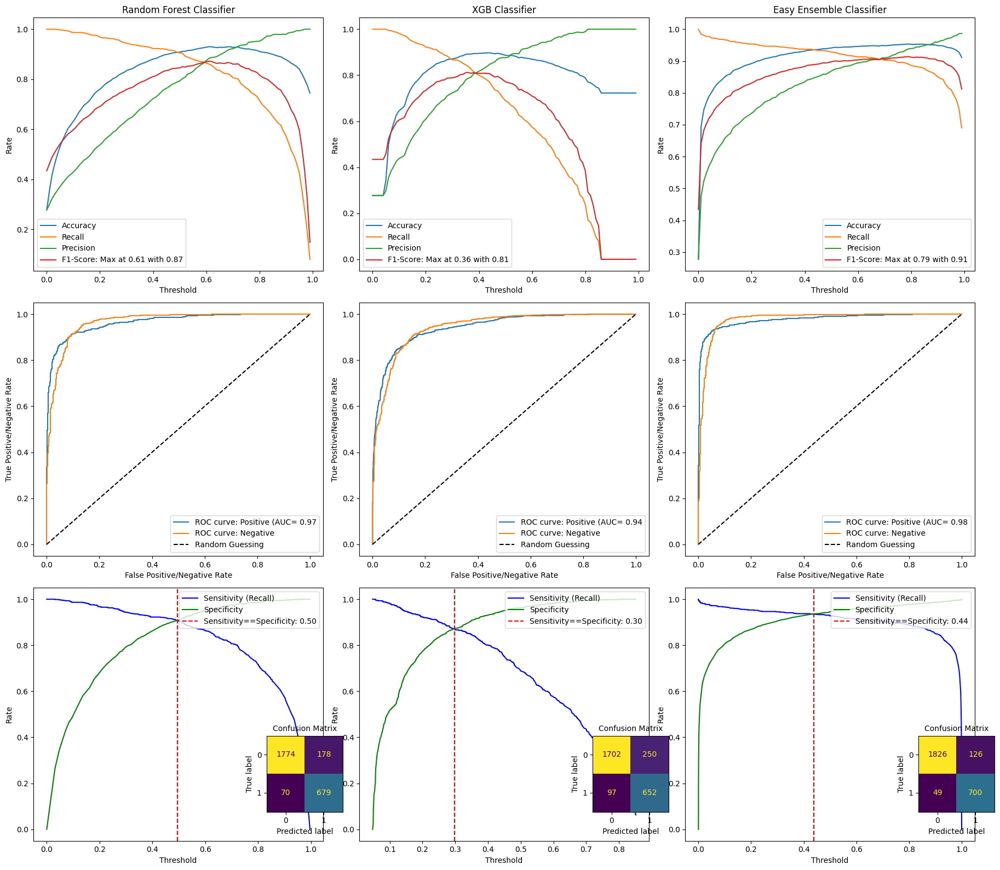

In [12]:
names = ['Random Forest Classifier','XGB Classifier','Easy Ensemble Classifier']
models = [rfc_model,xgb_model,ensemble_model]
evaluate_all_models_metrics(models,df_test,names,features)

[Back to top](#top)


# 2. Spatial Cross-Validation

## 2.1 First Cluster Approach

K-Fold Clustering with all datapoints


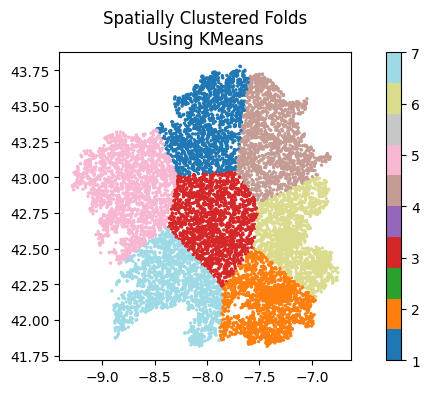

In [3]:
features = ['ndvi','altitude','slope','aspect','curvature','tmed','tmin','tmax','prec','dir','velmedia','racha','hrMedia','hrMin']
gdf_clusters = cluster_dataset()

Random Forest Classifier


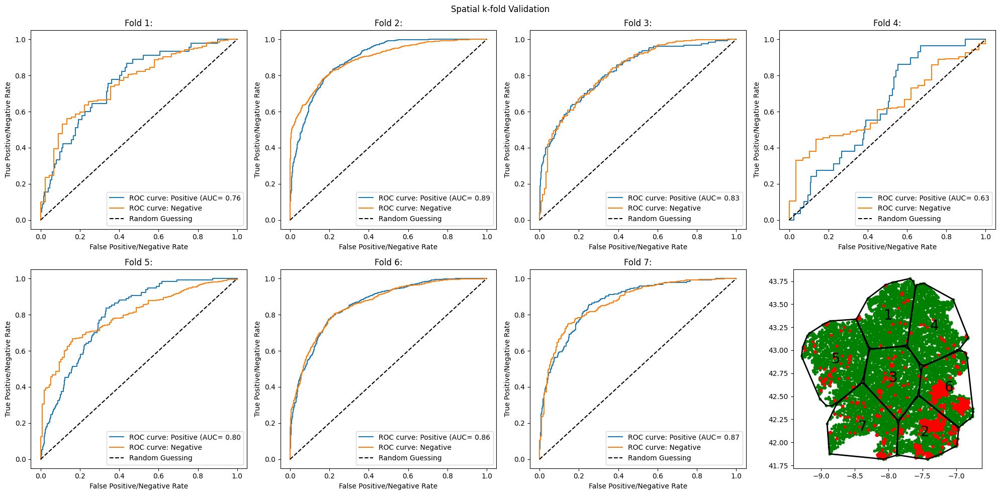

XGB Classifier


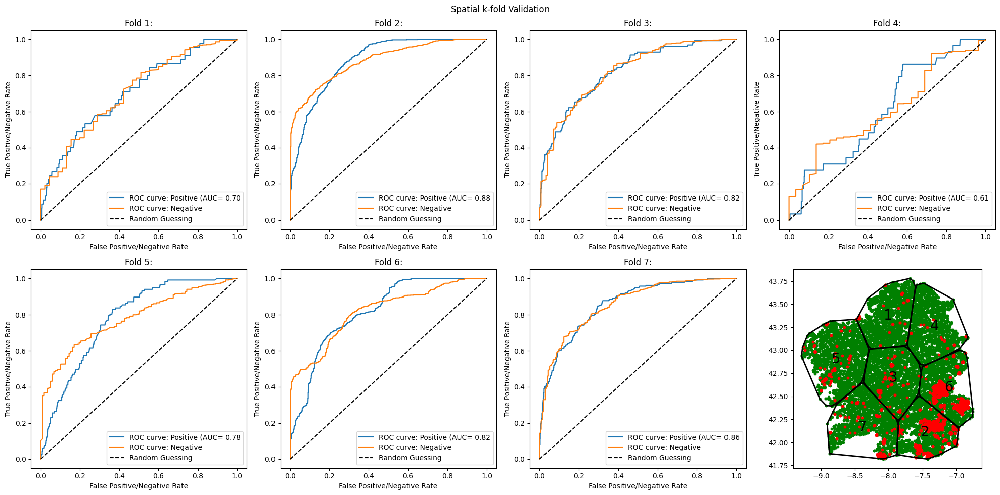

Easy Ensemble Classifier


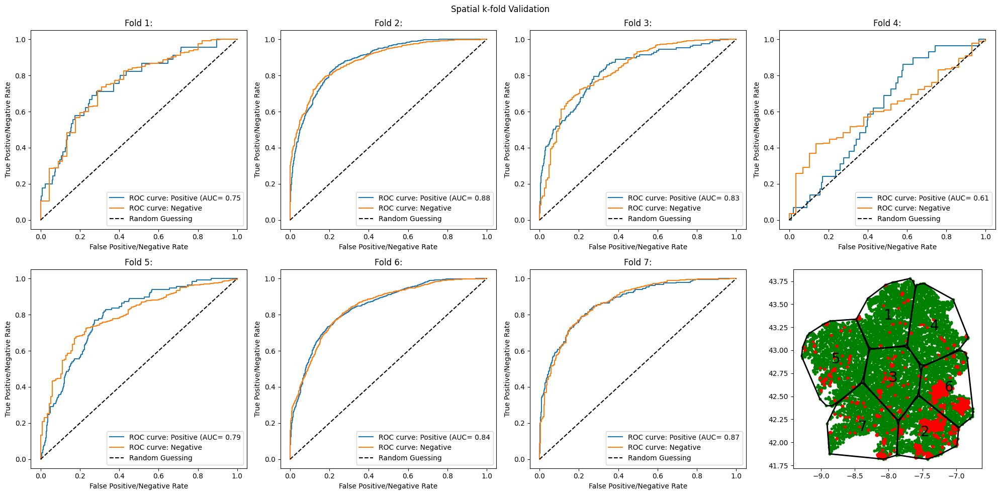

In [6]:
names = ['Random Forest Classifier','XGB Classifier','Easy Ensemble Classifier']

for name in names:
    if name == 'Random Forest Classifier':
        parameters = best_parameters_rf
    elif name == 'XGB Classifier':
        parameters = best_parameters_xgb
    else:
        parameters = None
    spatial_evaluation_one_model(name,gdf_clusters,features=features,model_parameters=parameters)

Group left out: 1
Training with 7216 samples
Training with 7216 samples
Training with 12100 samples


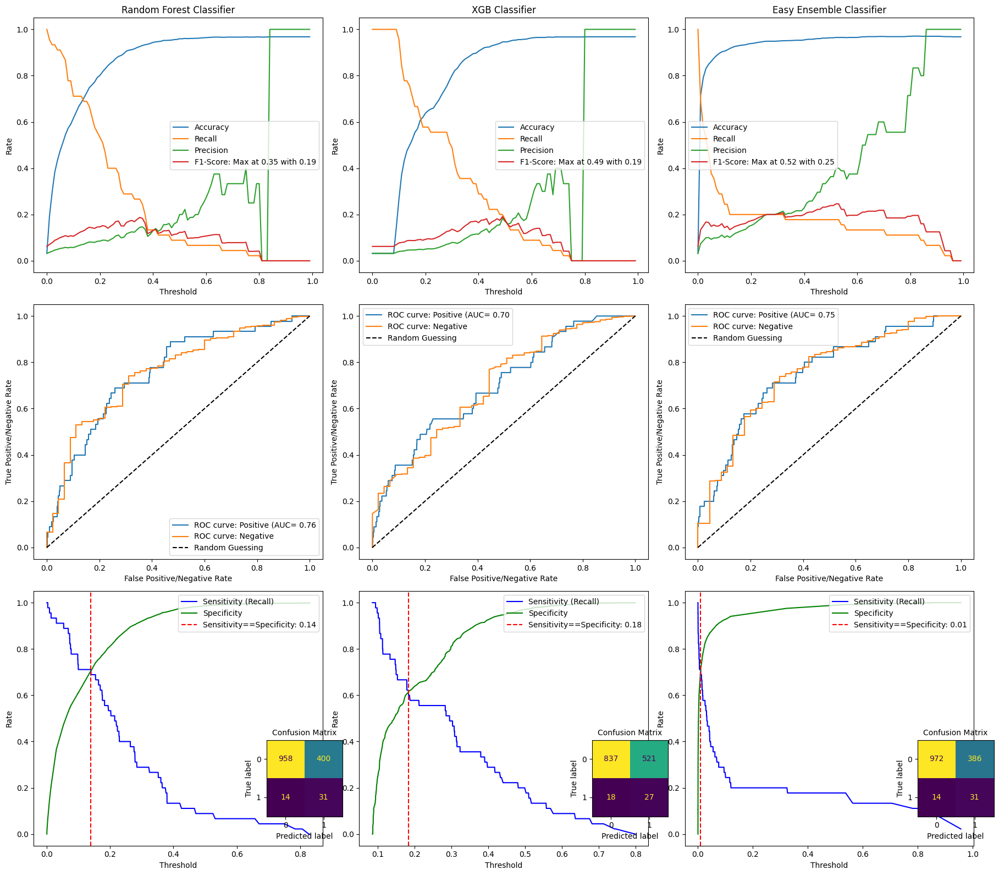

Group left out: 2
Training with 10984 samples
Training with 10984 samples
Training with 10984 samples


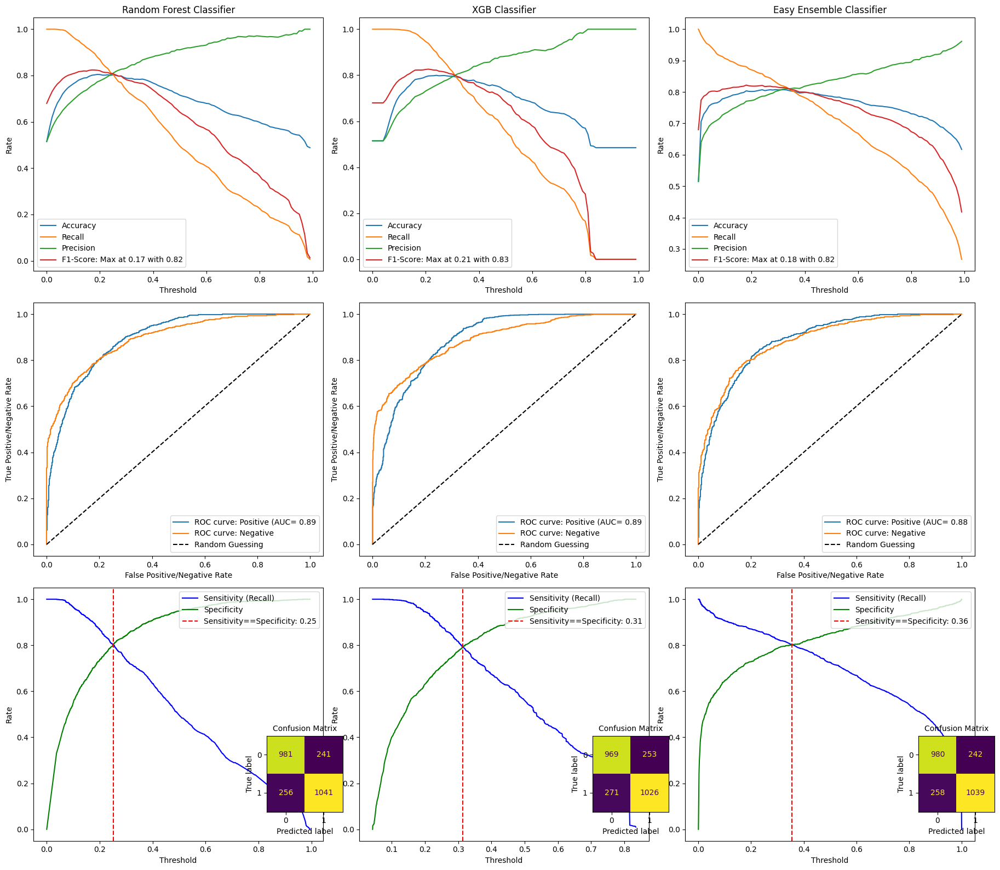

Group left out: 3
Training with 11829 samples
Training with 11829 samples
Training with 11829 samples


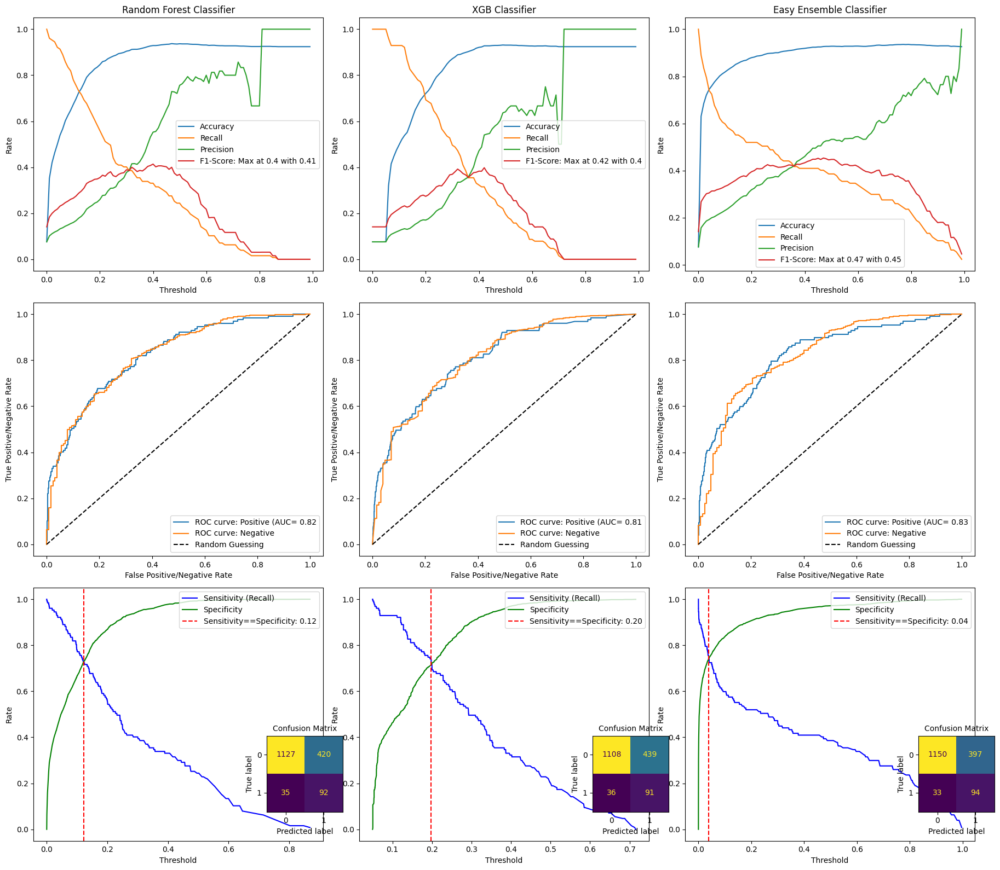

Group left out: 4
Training with 12047 samples
Training with 12047 samples
Training with 12047 samples


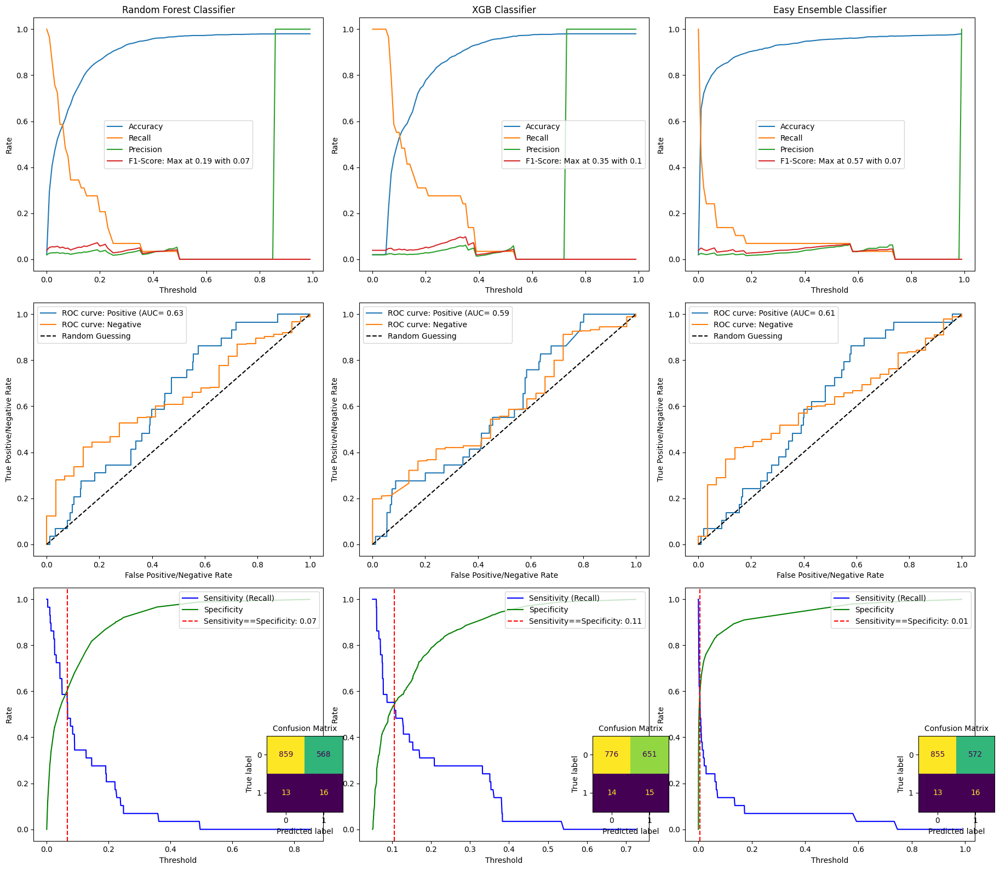

Group left out: 5
Training with 11691 samples
Training with 11691 samples
Training with 11691 samples


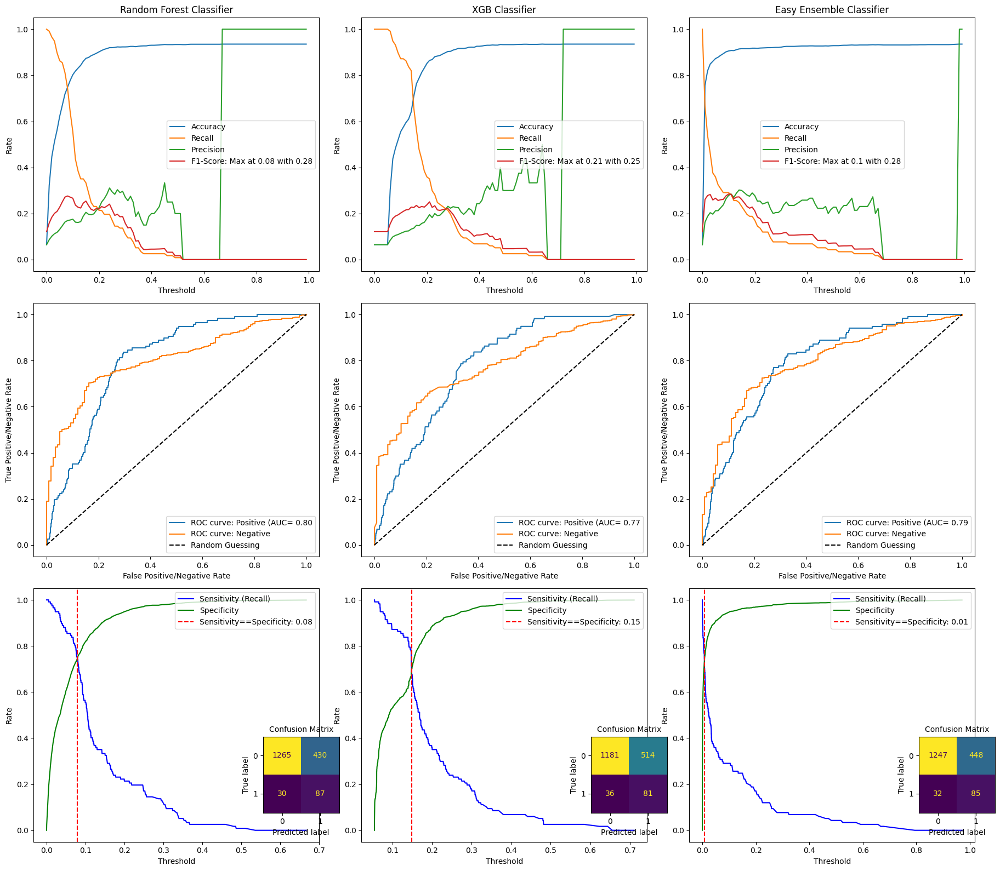

Group left out: 6
Training with 10483 samples
Training with 10483 samples
Training with 10483 samples


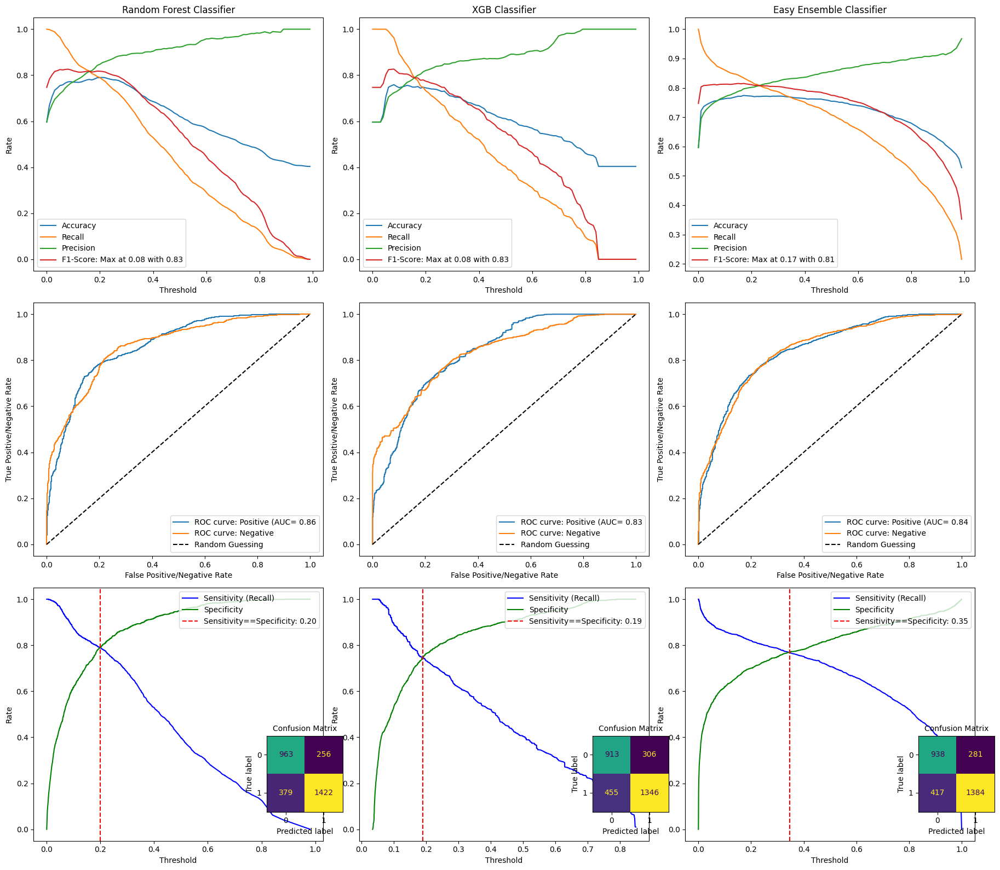

Group left out: 7
Training with 11884 samples
Training with 11884 samples
Training with 11884 samples


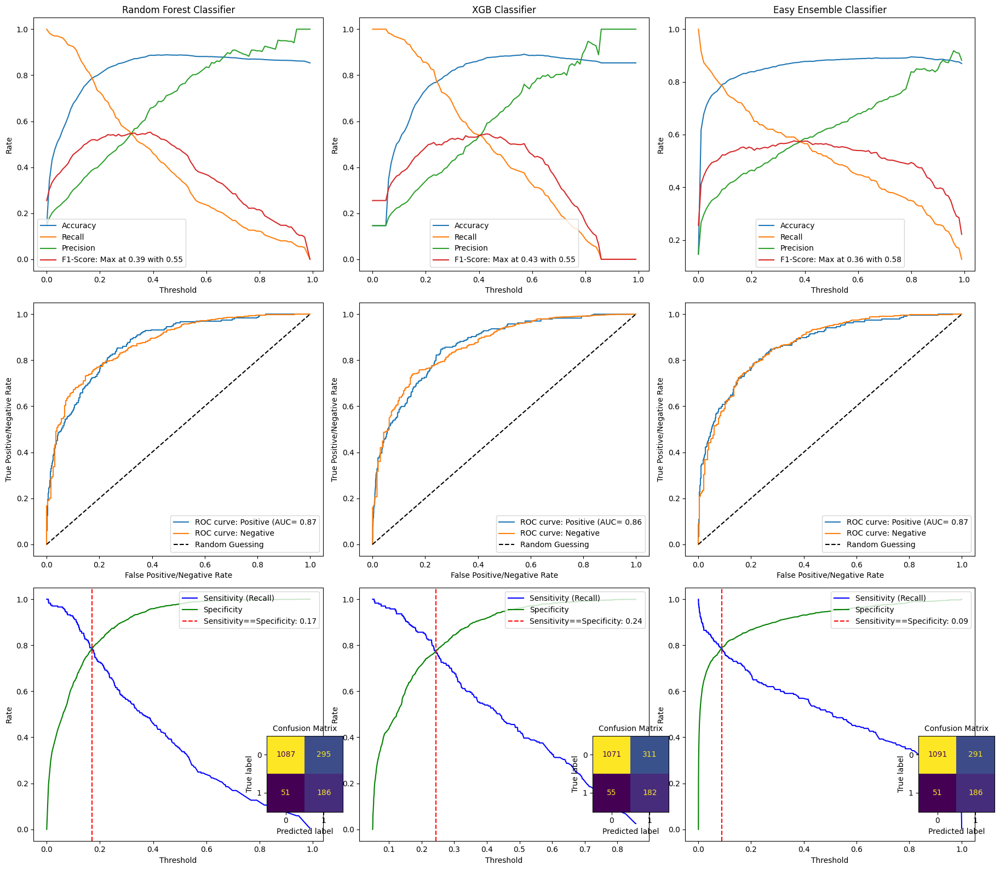

In [4]:
names = ['Random Forest Classifier','XGB Classifier','Easy Ensemble Classifier']
best_parameters_rf = {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}
best_parameters_xgb = {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 200, 'subsample': 1.0}
spatial_evaluation(names,gdf_clusters,features=features,model_parameters=[best_parameters_rf,best_parameters_xgb])

[Back to top](#top)


## 2.2 Second Cluster Approach

K-Fold Clustering with first clustering positive samples and sorting negative samples


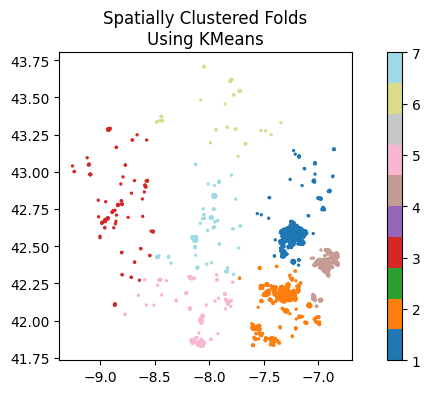

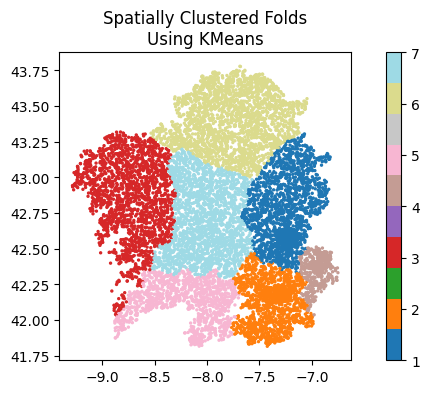

In [7]:
gdf_clusters = cluster_dataset()

Random Forest Classifier


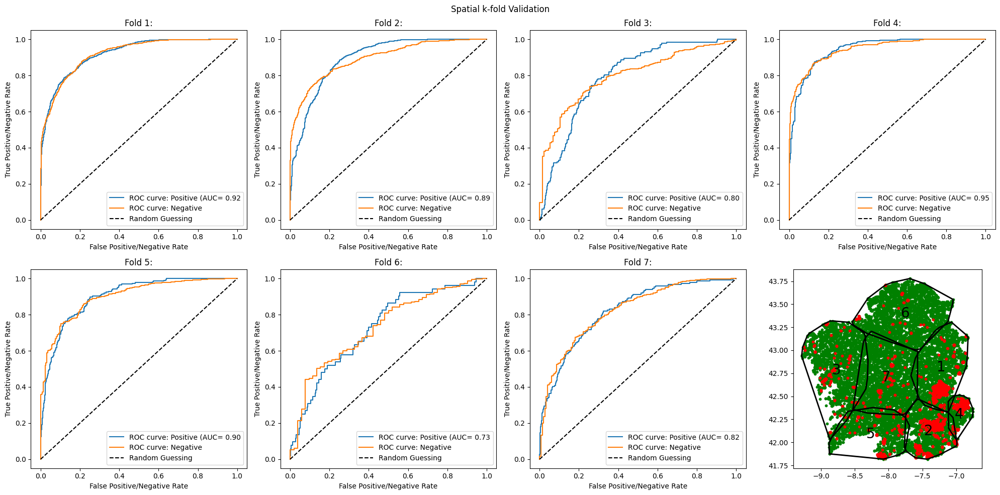

XGB Classifier


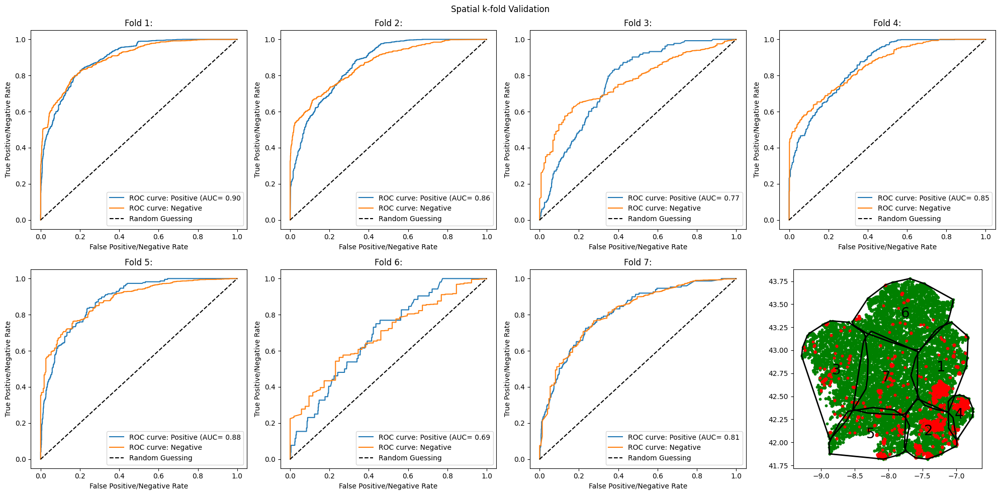

Easy Ensemble Classifier


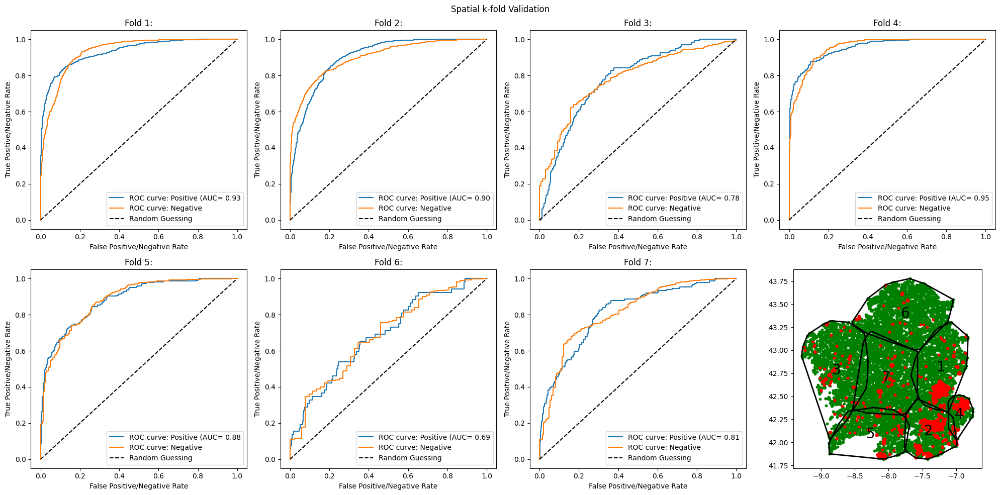

In [9]:
names = ['Random Forest Classifier','XGB Classifier','Easy Ensemble Classifier']

for name in names:
    if name == 'Random Forest Classifier':
        parameters = best_parameters_rf
    elif name == 'XGB Classifier':
        parameters = best_parameters_xgb
    else:
        parameters = None
    spatial_evaluation_one_model(name,gdf_clusters,features=features,model_parameters=parameters)

Group left out: 1
Training with 4788 samples
Training with 4788 samples
Training with 10697 samples


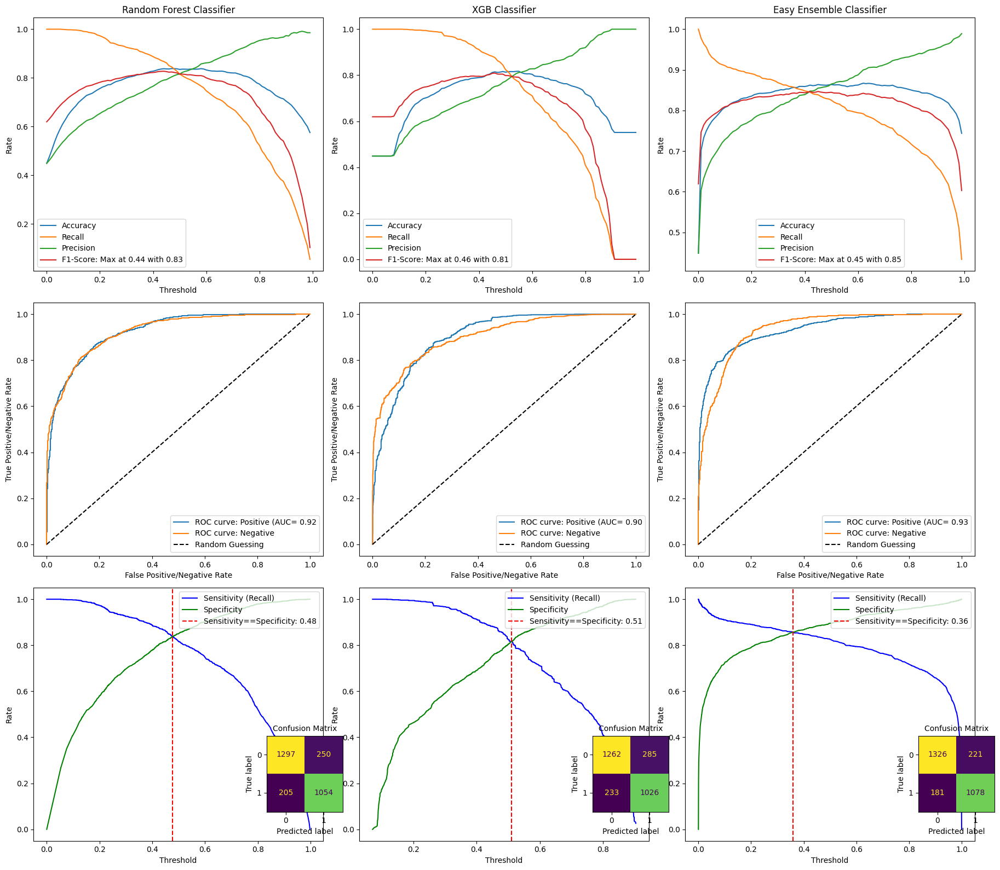

Group left out: 2
Training with 11228 samples
Training with 11228 samples
Training with 11228 samples


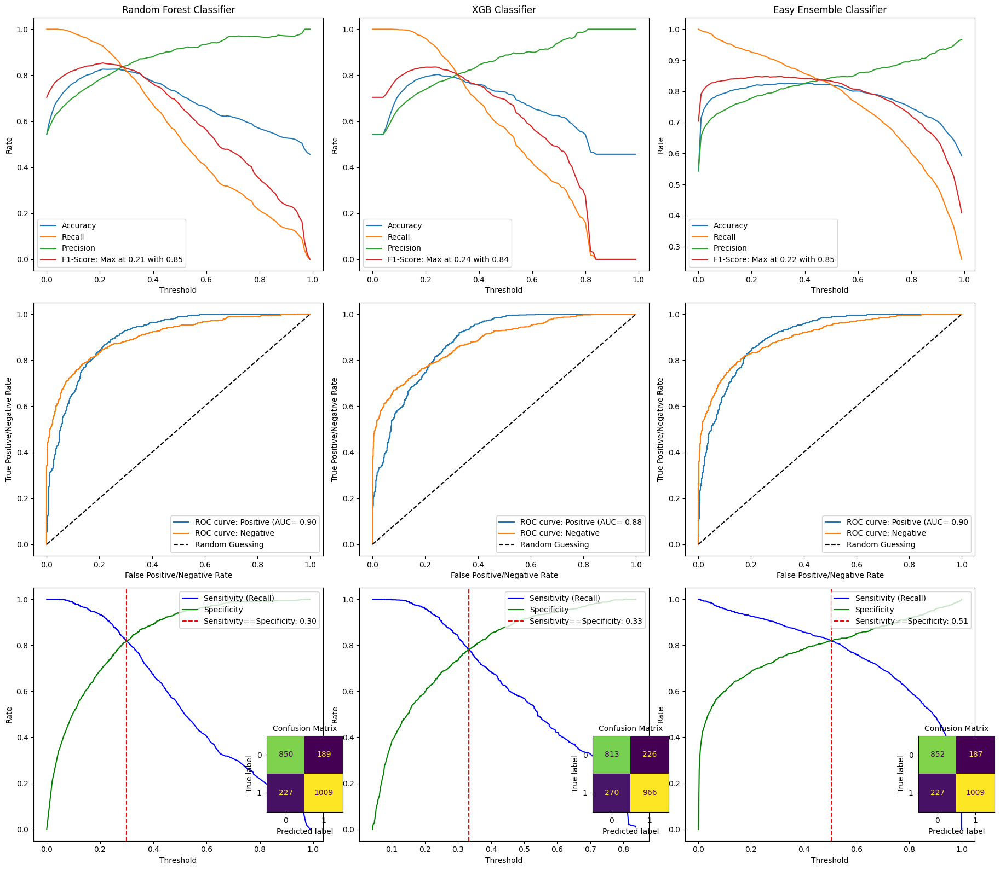

Group left out: 3
Training with 11477 samples
Training with 11477 samples
Training with 11477 samples


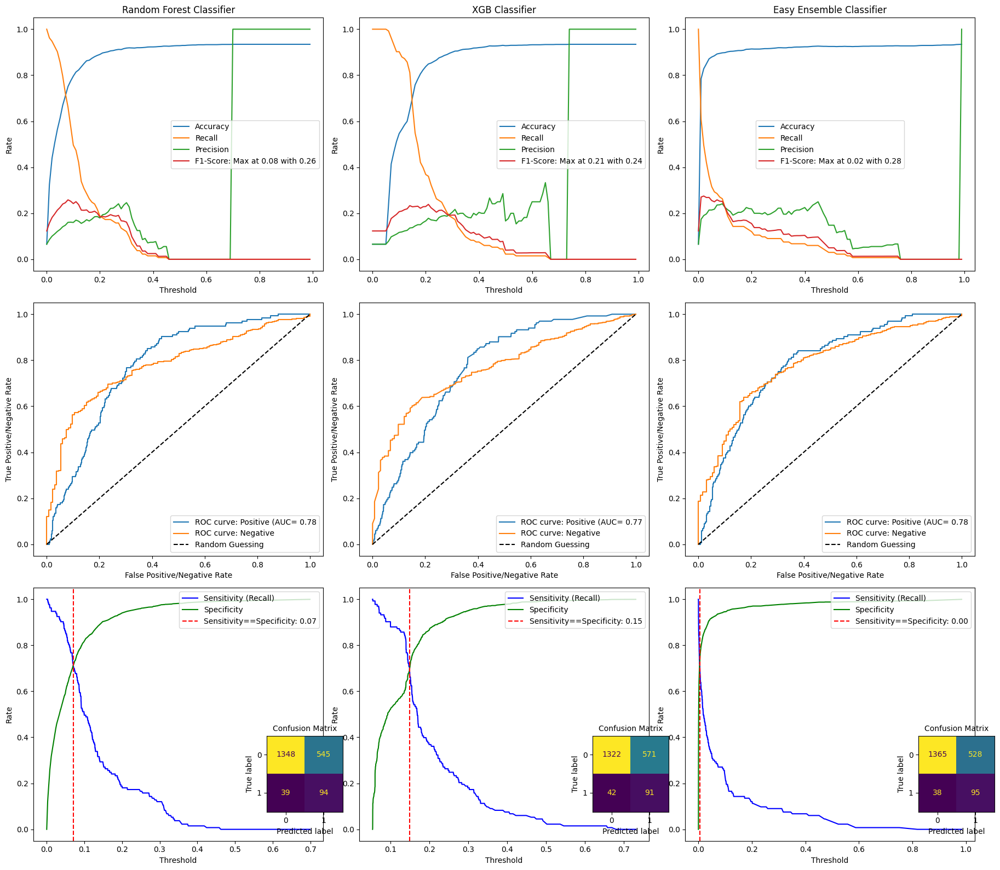

Group left out: 4
Training with 12589 samples
Training with 12589 samples
Training with 12589 samples


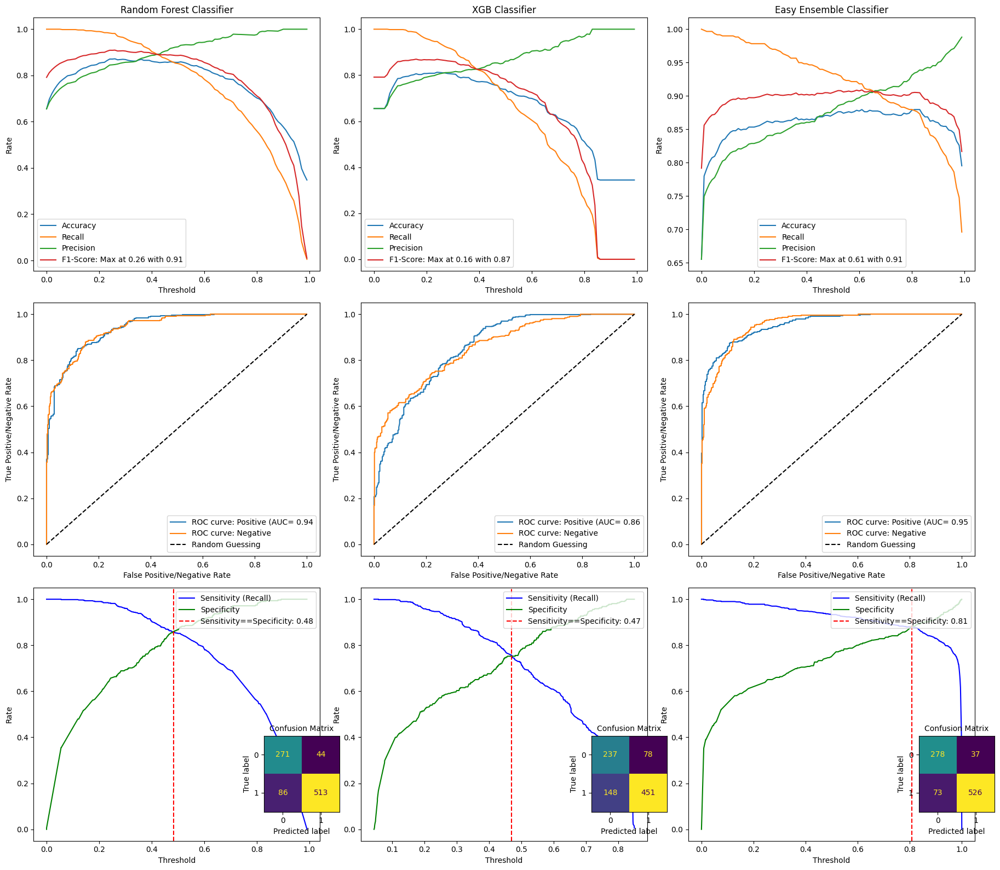

Group left out: 5
Training with 12225 samples
Training with 12225 samples
Training with 12225 samples


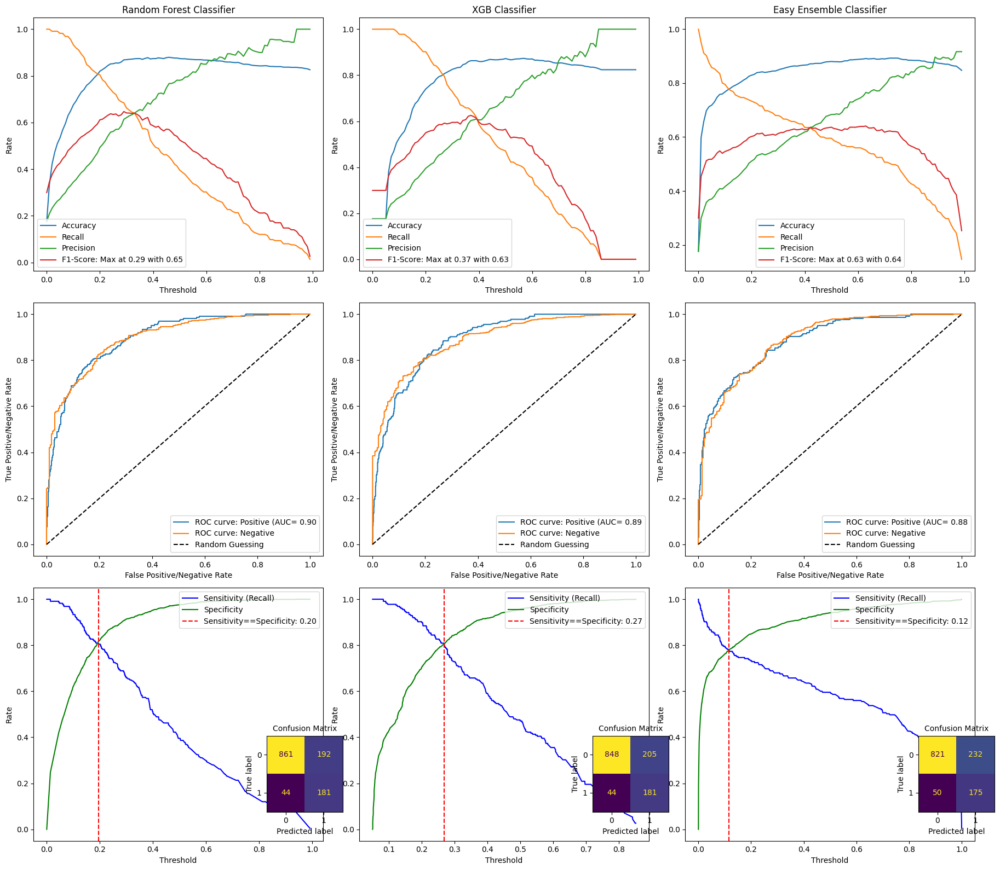

Group left out: 6
Training with 11350 samples
Training with 11350 samples
Training with 11350 samples


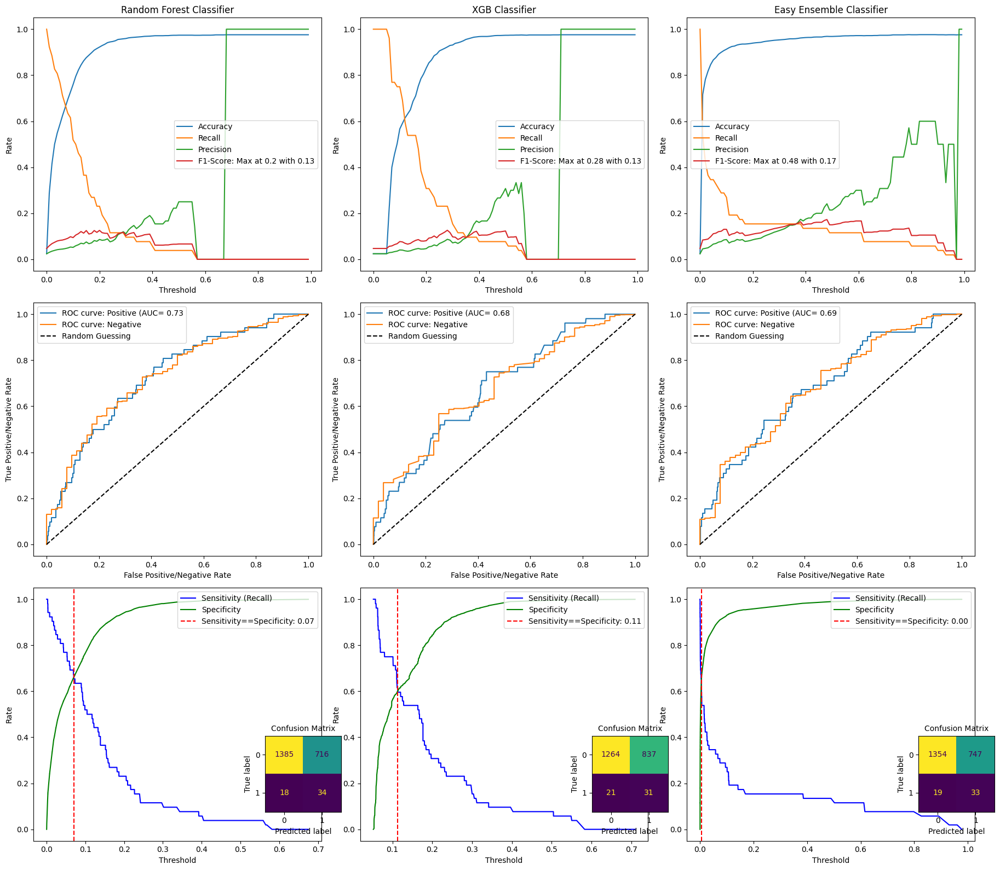

Group left out: 7
Training with 11452 samples
Training with 11452 samples
Training with 11452 samples


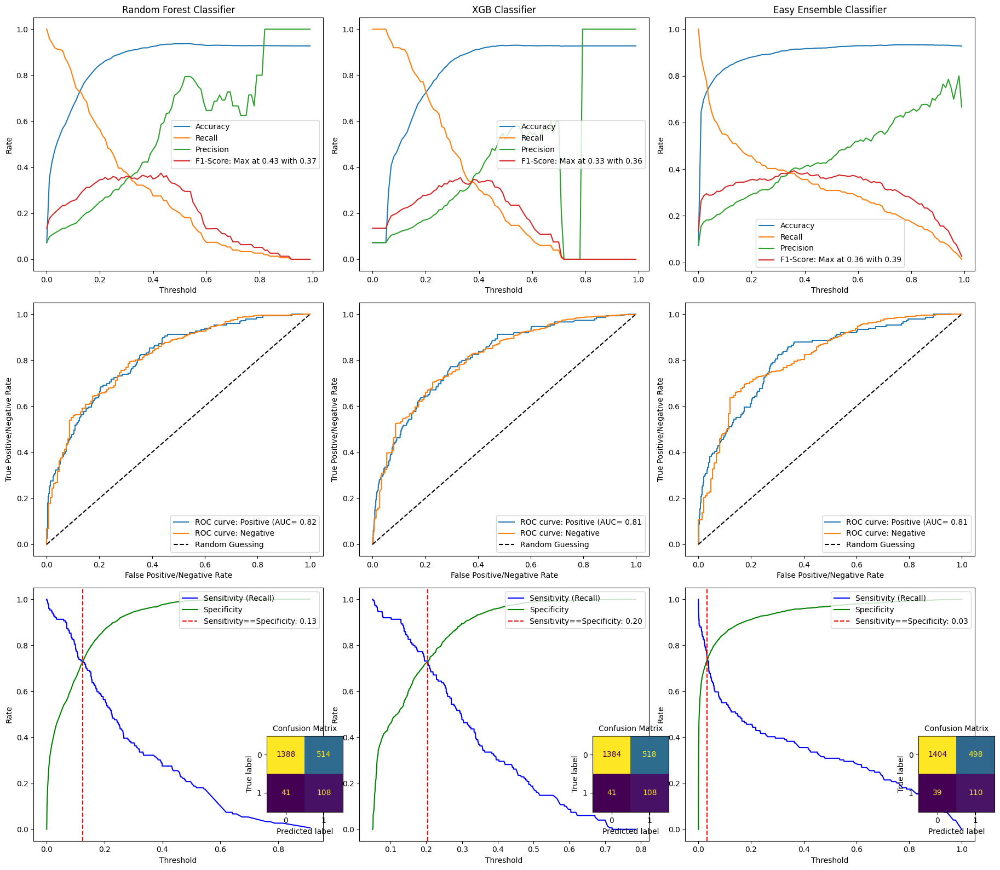

In [10]:
names = ['Random Forest Classifier','XGB Classifier','Easy Ensemble Classifier']
spatial_evaluation(names,gdf_clusters,features=features,model_parameters=[best_parameters_rf,best_parameters_xgb])

[Back to top](#top)


# 3. Temporal Cross-Validation:

In [ ]:
df_true = pd.read_csv('Daten/Dataset/complete_true_samples/veg_season_updated_weather.csv', converters={
    'ndvi': ast.literal_eval,
})

df_neg = pd.read_csv('Daten/Dataset/neg_samples/all_Apr_Sep_second.csv', converters={
    'ndvi': ast.literal_eval,
})

features = ['ndvi','altitude','slope','aspect','curvature','tmed','tmin','tmax','prec','dir','velmedia','racha','hrMedia','hrMin']
df_true = prepare_data(df_true,1)
df_neg = prepare_data(df_neg,0)
df = pd.concat([df_true,df_neg],axis=0,ignore_index=True)



Evaluation for year 2020:


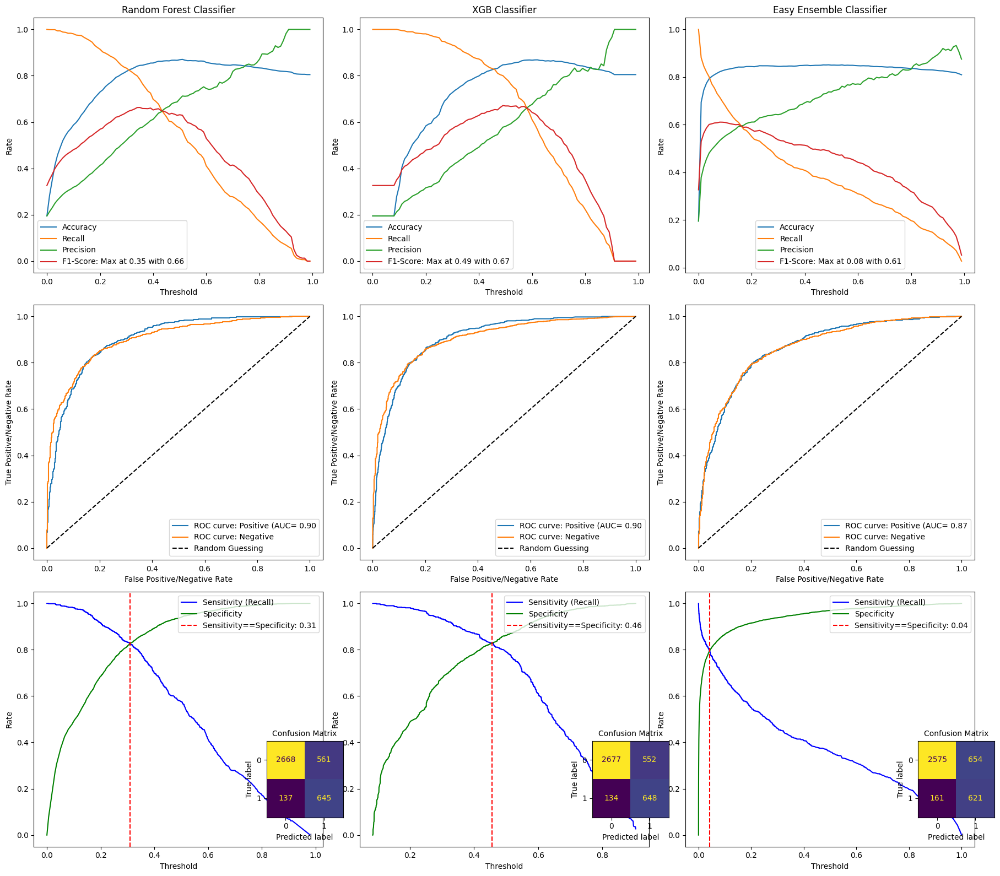

Evaluation for year 2021:


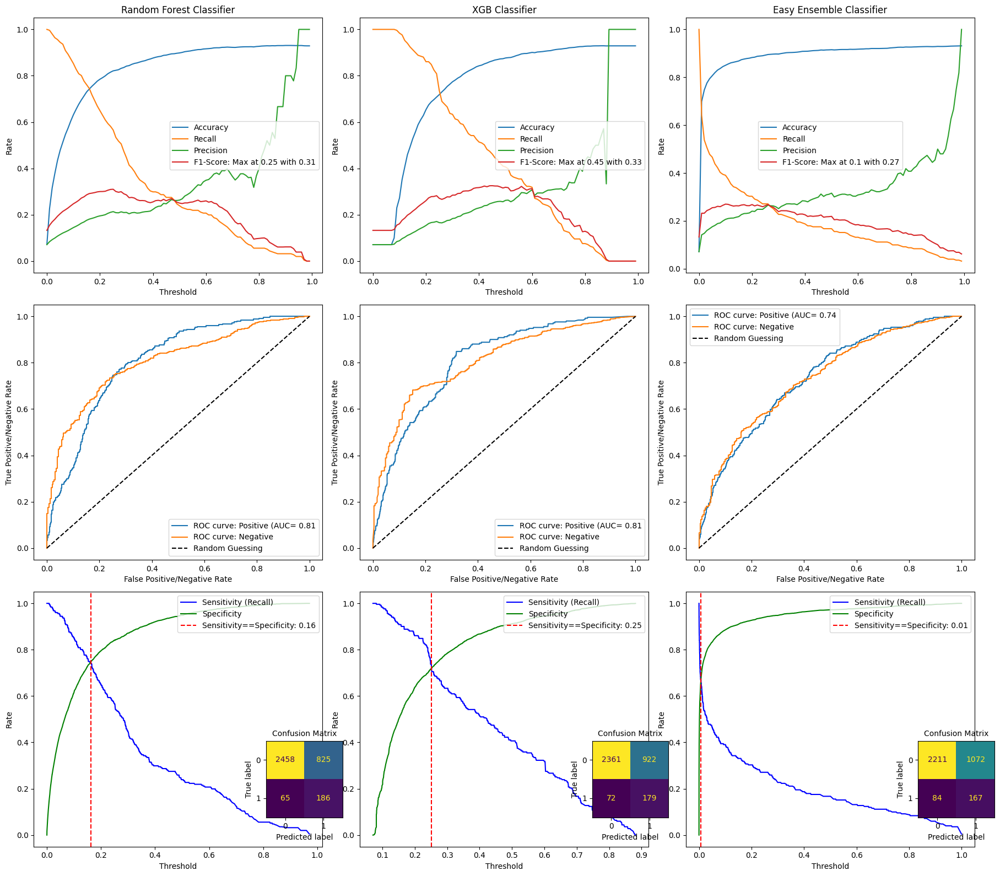

Evaluation for year 2022:


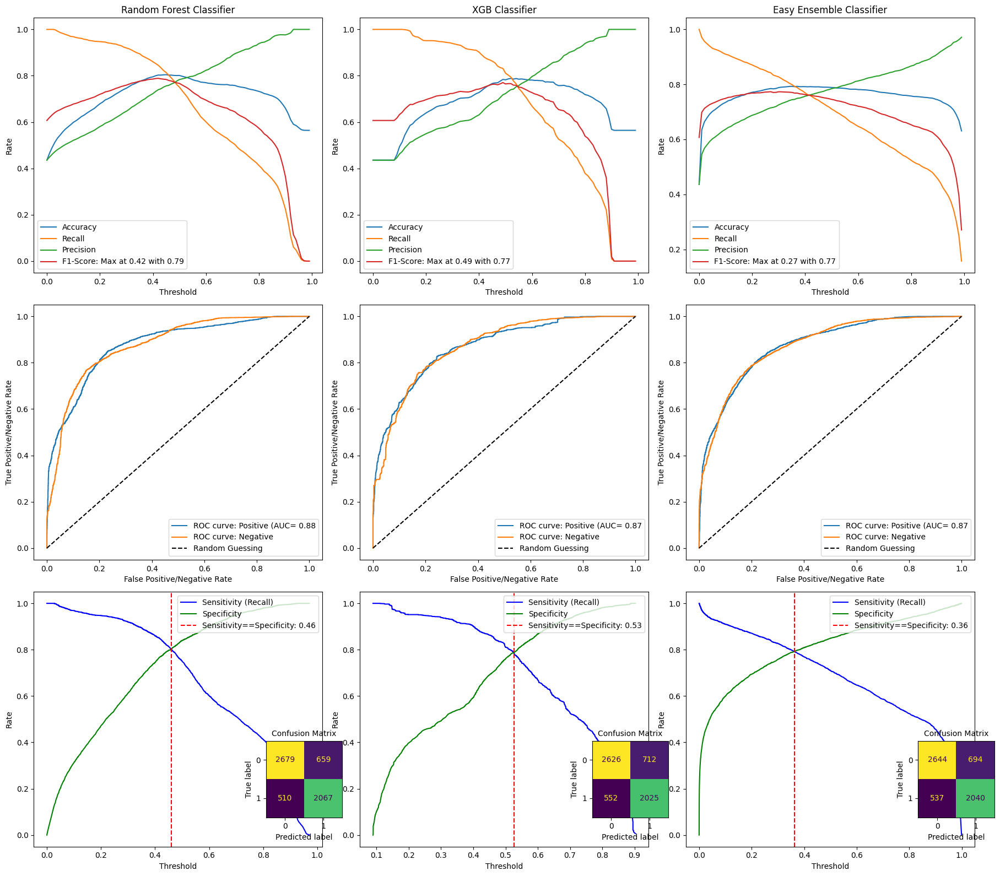

In [3]:
evaluate_temporal(df,features)

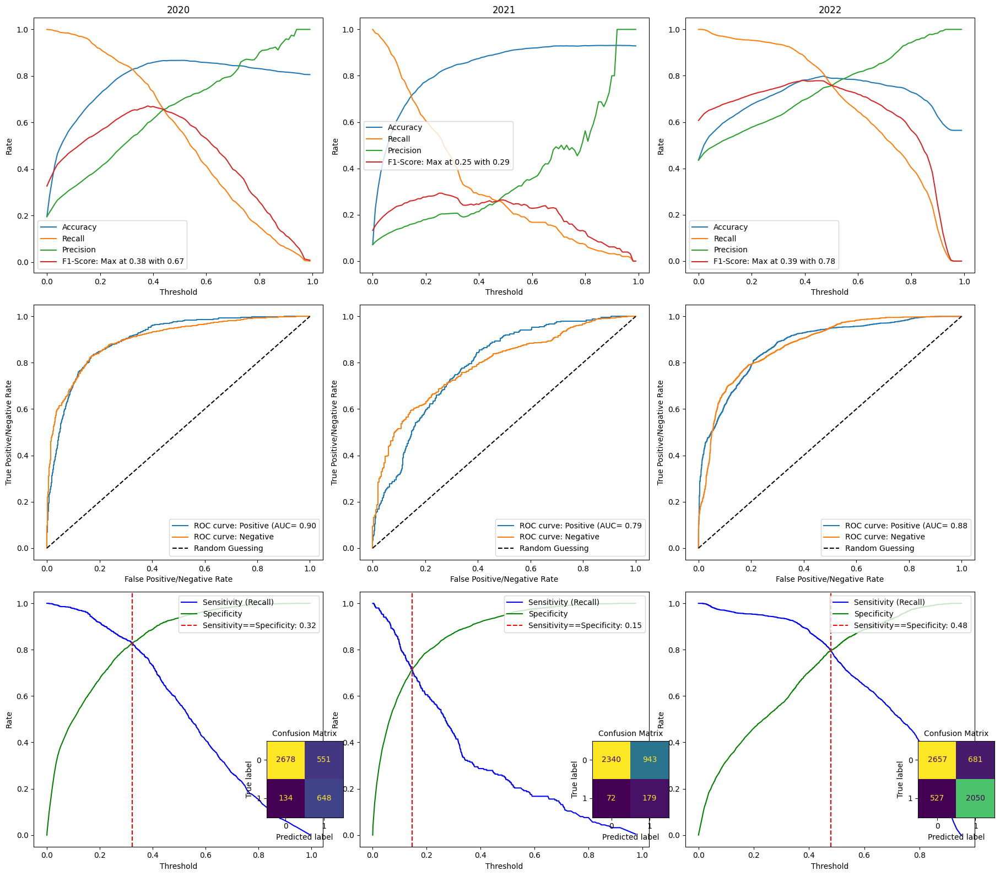

In [5]:
evaluate_temporal_one_model(df,"Random Forest Classifier",features)

[Back to top](#top)


# 4. Spatial-Temporal Validation

K-Fold Clustering with first clustering positive samples and sorting negative samples


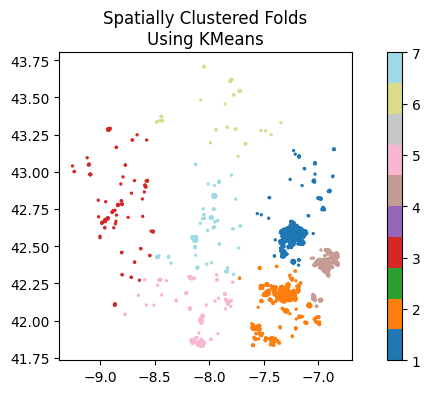

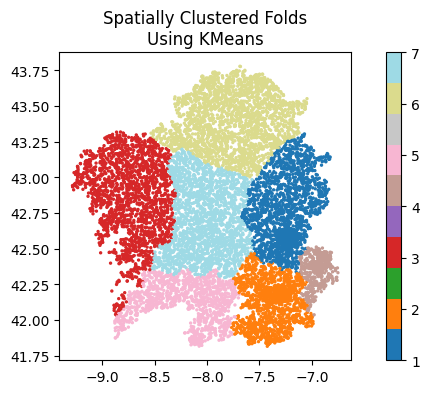

In [2]:
gdf_clusters = cluster_dataset()

Random Forest Classifier


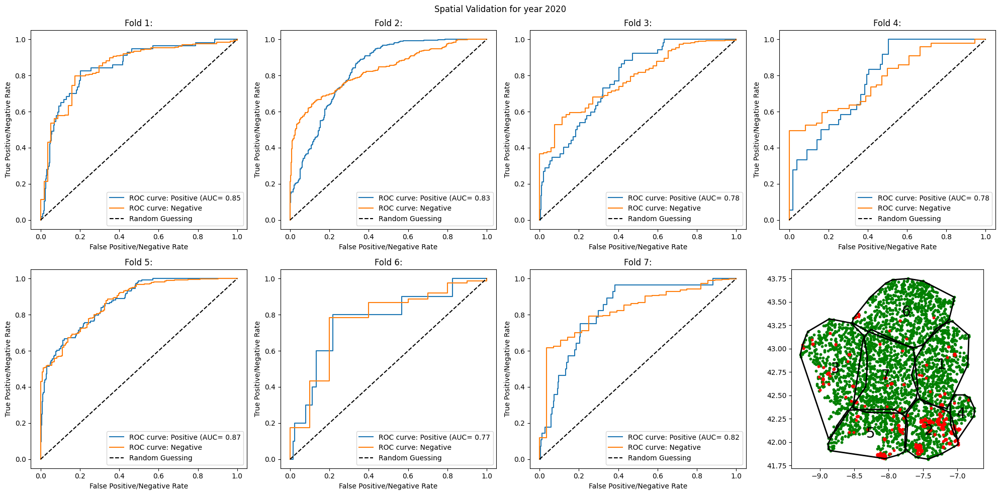

XGB Classifier


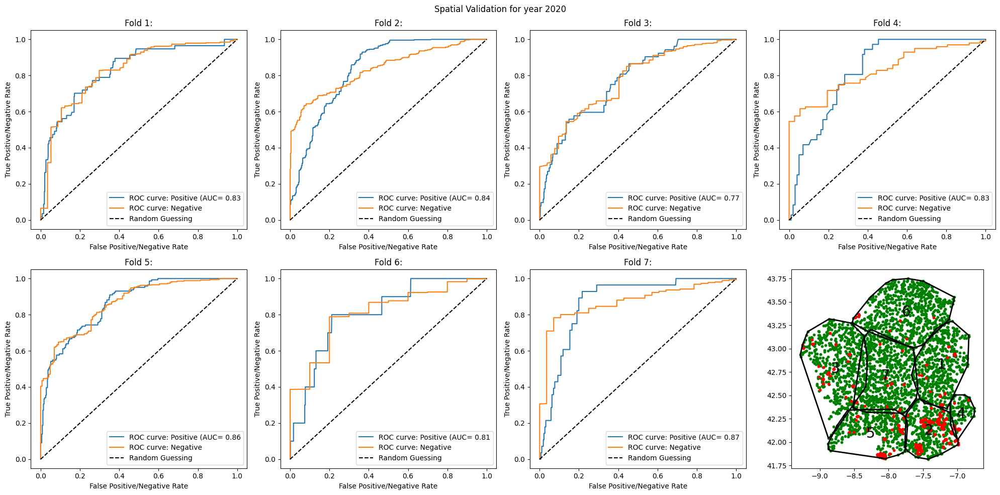

Easy Ensemble Classifier


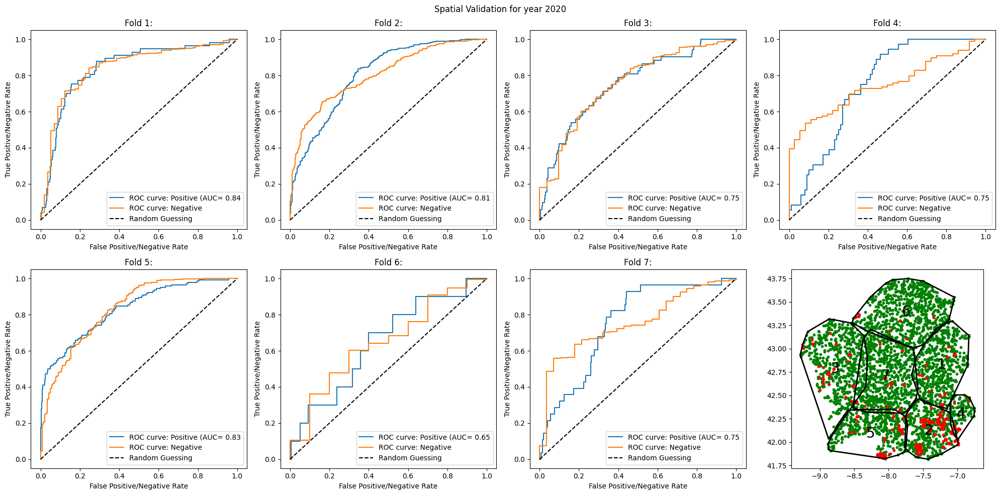

Random Forest Classifier


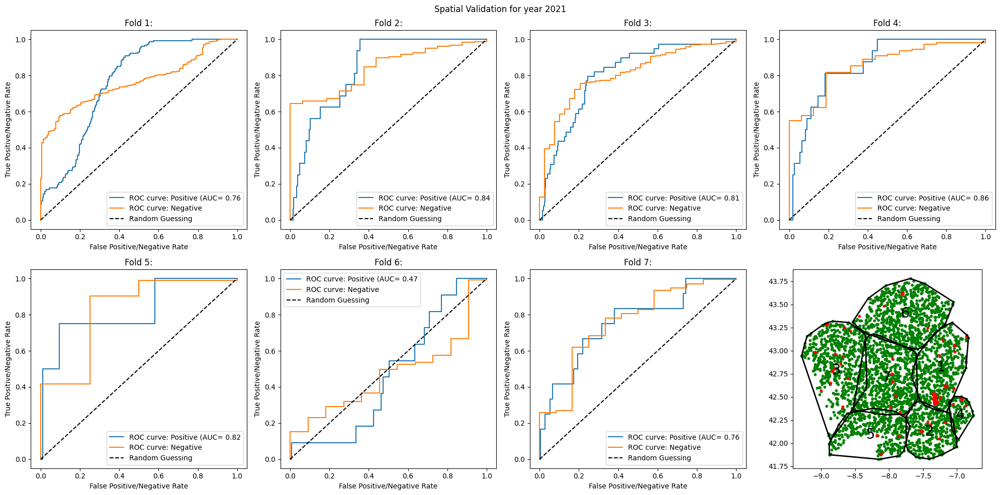

XGB Classifier


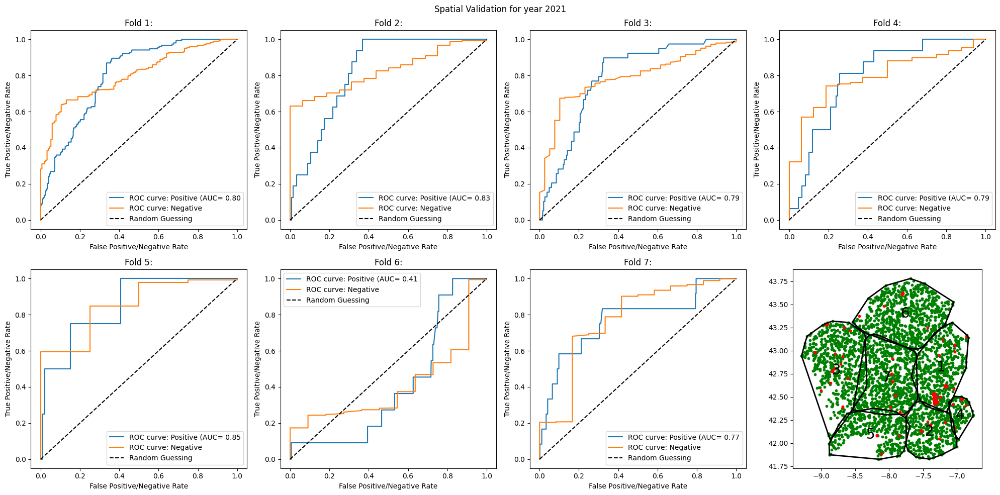

Easy Ensemble Classifier


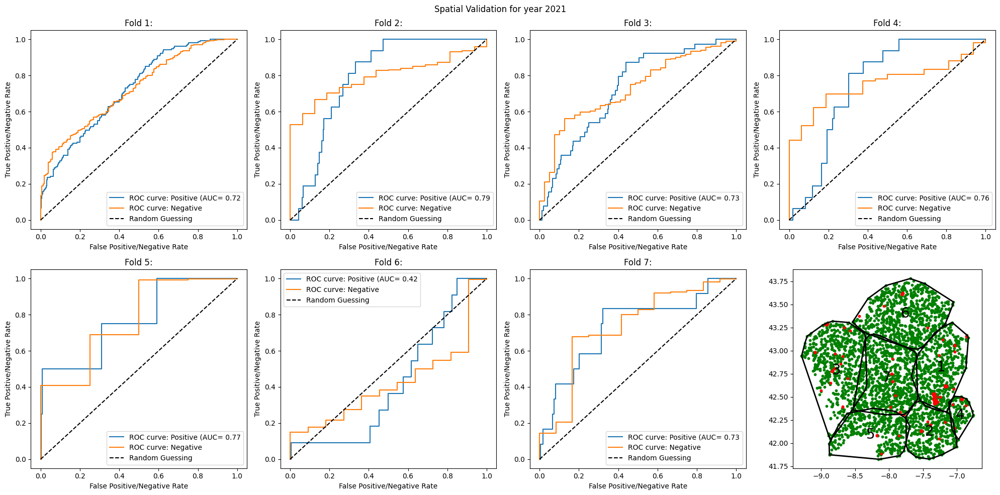

Random Forest Classifier


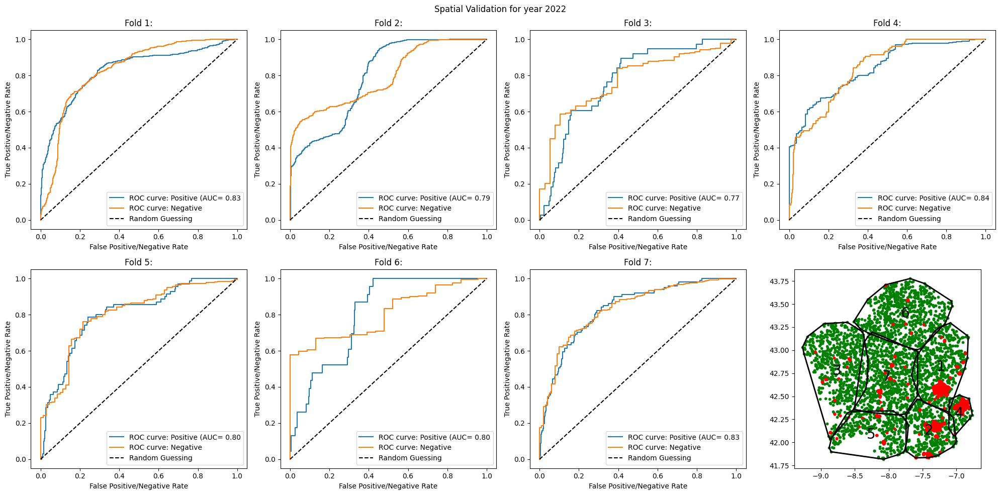

XGB Classifier


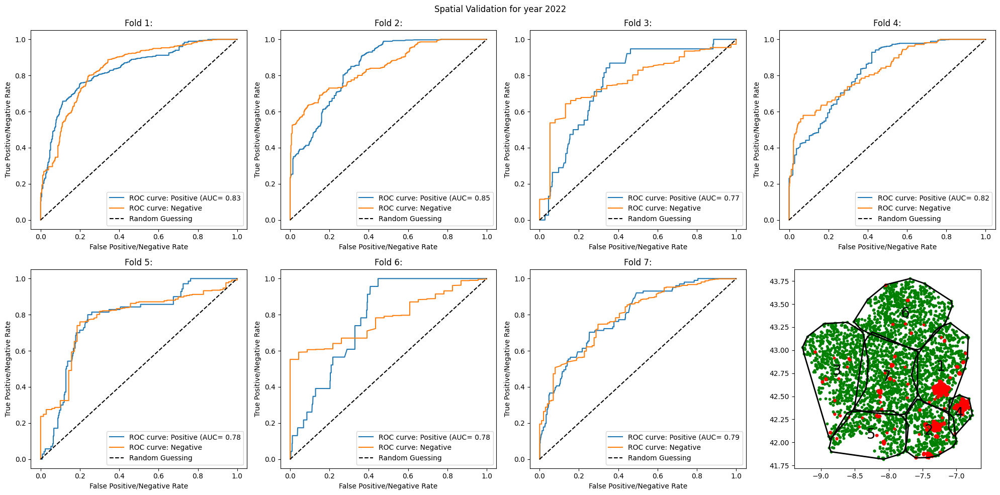

Easy Ensemble Classifier


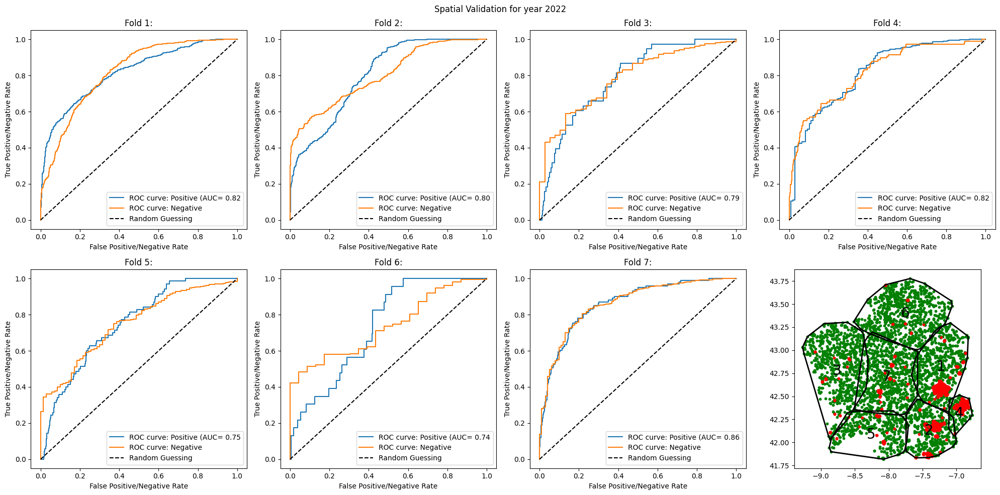

In [3]:
features = ['ndvi','altitude','slope','aspect','curvature','tmed','tmin','tmax','prec','dir','velmedia','racha','hrMedia','hrMin']
evaluate_spatial_temporal(gdf_clusters,features)

[Back to top](#top)


# 5. Feature Importance

In [ ]:
df_true = pd.read_csv('Daten/Dataset/complete_true_samples/veg_season_updated_weather.csv', converters={
    'ndvi': ast.literal_eval,
})

df_neg = pd.read_csv('Daten/Dataset/neg_samples/all_Apr_Sep_second.csv', converters={
    'ndvi': ast.literal_eval,
})


In [5]:
features = ['ndvi','altitude','slope','aspect','curvature','tmed','tmin','tmax','prec','dir','velmedia','racha','hrMedia','hrMin']
df_true = prepare_data(df_true,1)
df_neg = prepare_data(df_neg,0)
df = pd.concat([df_true,df_neg],axis=0,ignore_index=True)
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)
df_train_sampled = sample_len_df(df_train)

In [6]:
best_parameters_rf = [{'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100},{'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100},{'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}]
best_parameters_xgb = [{'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 200, 'subsample': 1.0},{'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.6},{'colsample_bytree': 0.6, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}]

xgb_model = XGBClassifier(objective='binary:logistic', random_state=42,**best_parameters_xgb[0])
rfc_model = RandomForestClassifier(random_state=42,**best_parameters_rf[0])
ensemble_model = EasyEnsembleClassifier(estimator=XGBClassifier(objective='binary:logistic', random_state=42,colsample_bytree= 0.6,learning_rate= 0.3,max_depth = 7,min_child_weight =1,n_estimators= 200,subsample=1.0),n_estimators=20,random_state=42) #with grid search


In [7]:

xgb_model.fit(df_train_sampled[features],df_train_sampled['label'])
rfc_model.fit(df_train_sampled[features],df_train_sampled['label'])
ensemble_model.fit(df_train[features],df_train['label'])

EasyEnsembleClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                               callbacks=None,
                                               colsample_bylevel=None,
                                               colsample_bynode=None,
                                               colsample_bytree=0.6,
                                               device=None,
                                               early_stopping_rounds=None,
                                               enable_categorical=False,
                                               eval_metric=None,
                                               feature_types=None, gamma=None,
                                               grow_policy=None,
                                               importance_type=None,
                                               interaction_constraints=None,
                                               learning_rate=0.3, max_bin=None,
                                               max_cat_threshold=None,
                                               max_cat_to_onehot=None,
                                               max_delta_step=None, max_depth=7,
                                               max_leaves=None,
                                               min_child_weight=1, missing=nan,
                                               monotone_constraints=None,
                                               multi_strategy=None,
                                               n_estimators=200, n_jobs=None,
                                               num_parallel_tree=None,
                                               random_state=42, ...),
                       n_estimators=20, random_state=42)

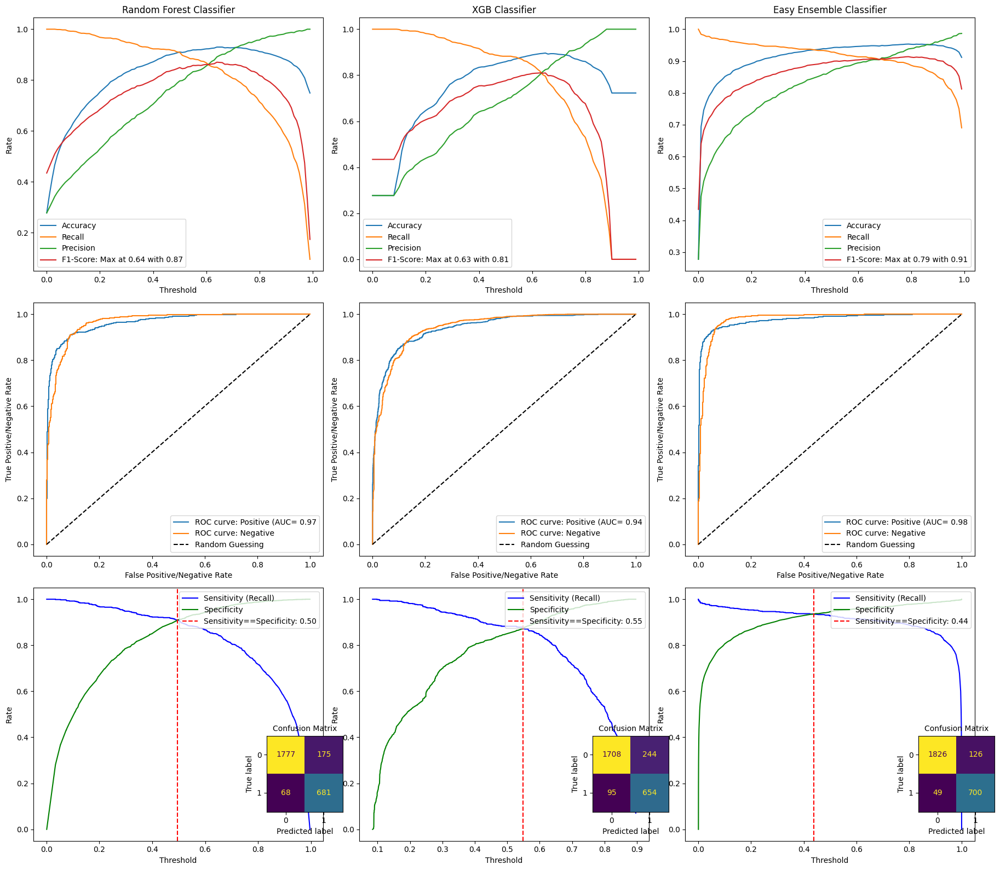

In [8]:
names = ['Random Forest Classifier','XGB Classifier','Easy Ensemble Classifier']
models = [rfc_model,xgb_model,ensemble_model]
evaluate_all_models_metrics(models,df_test,names,features)

## 5.1 Feature Importance for XGB Classifier

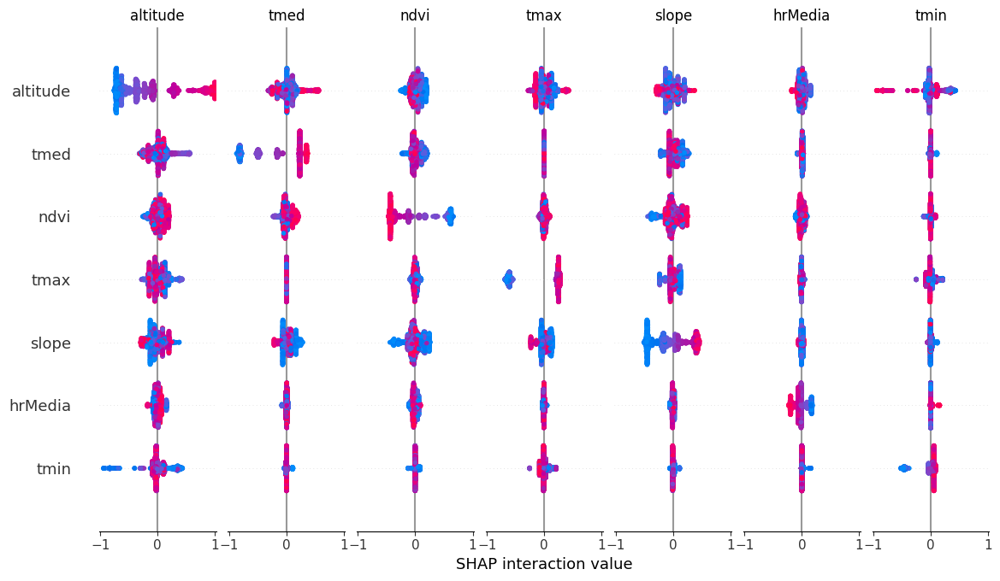

In [ ]:
import shap
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(df_test[features])
shap_interaction_values = explainer.shap_interaction_values(df_test[features])
shap.summary_plot(shap_interaction_values,df_test[features])

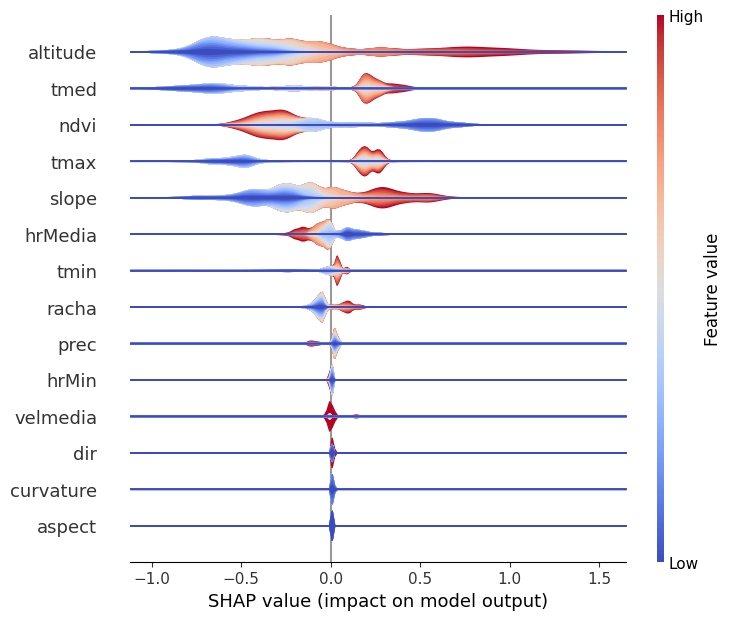

In [143]:

shap.plots.violin(shap_values, features=df_test[features], feature_names=df_test[features].columns, plot_type="layered_violin")

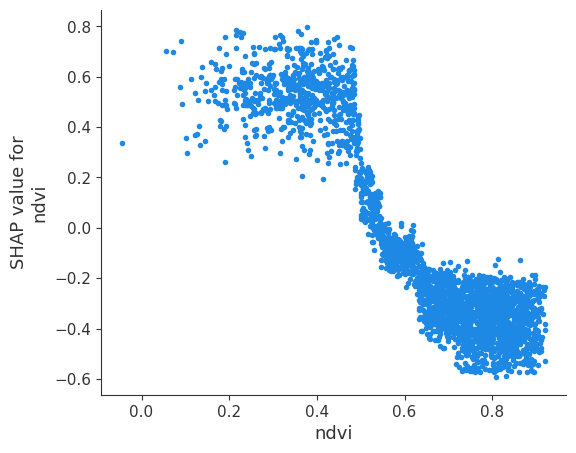

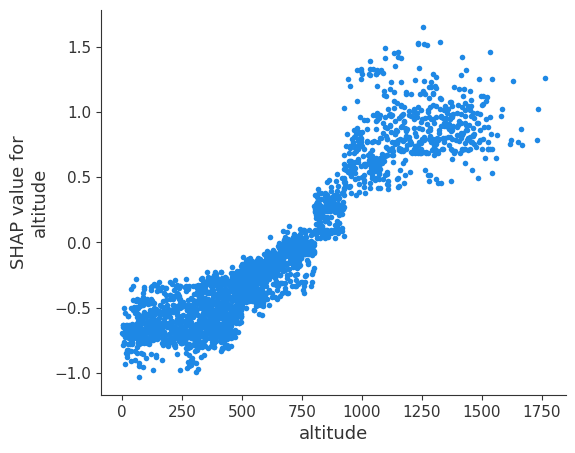

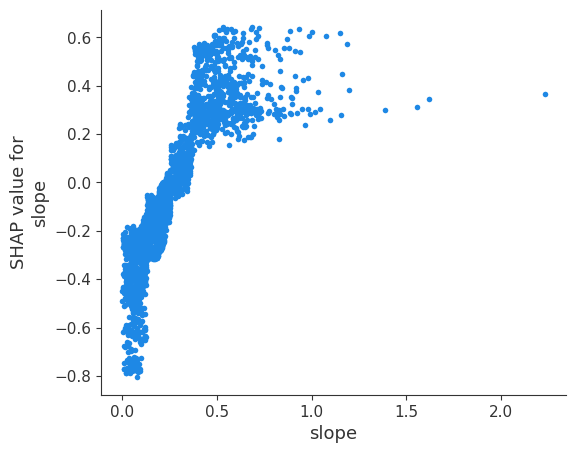

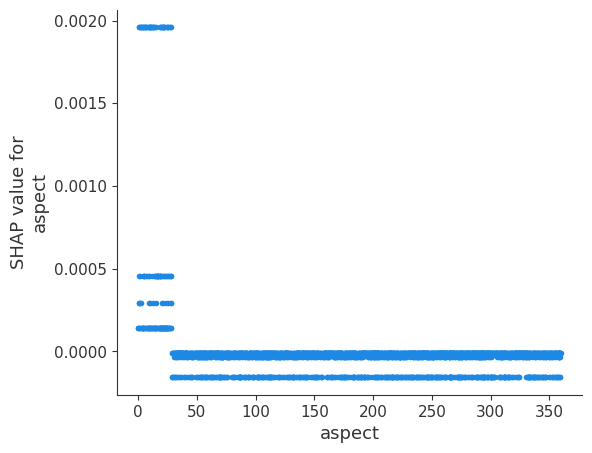

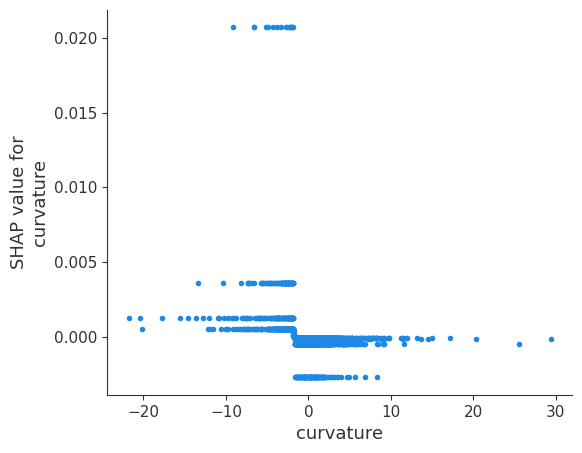

...

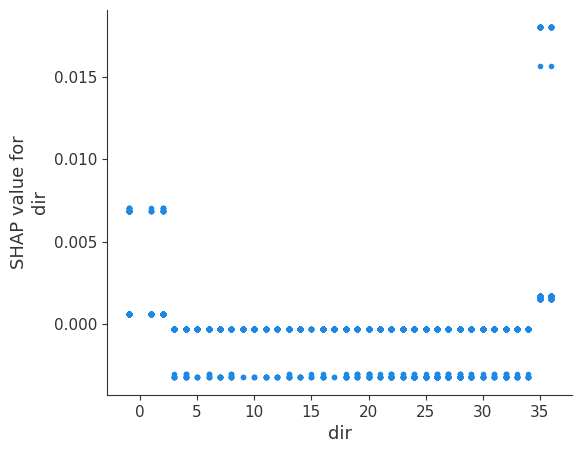

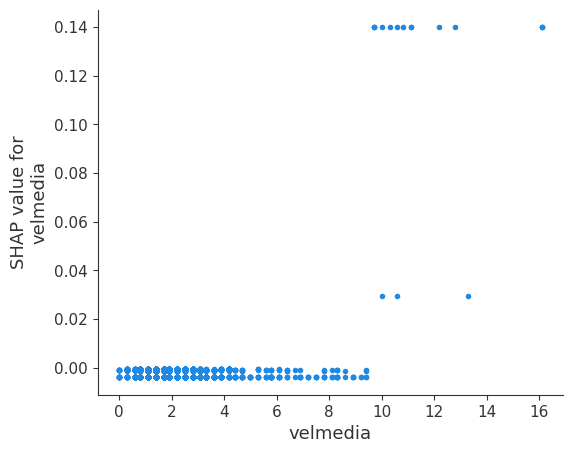

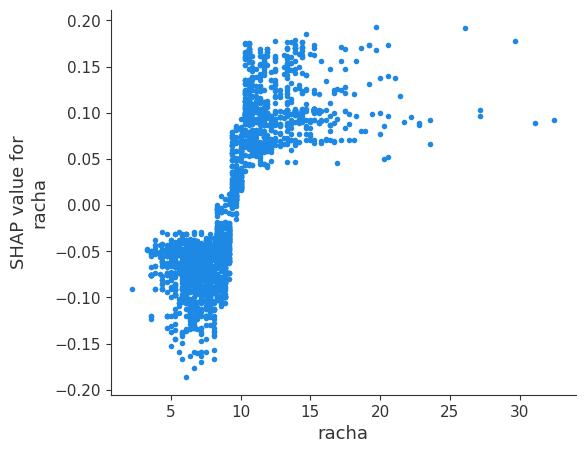

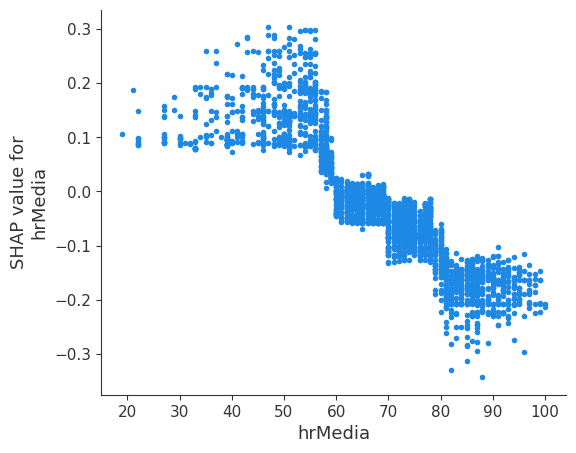

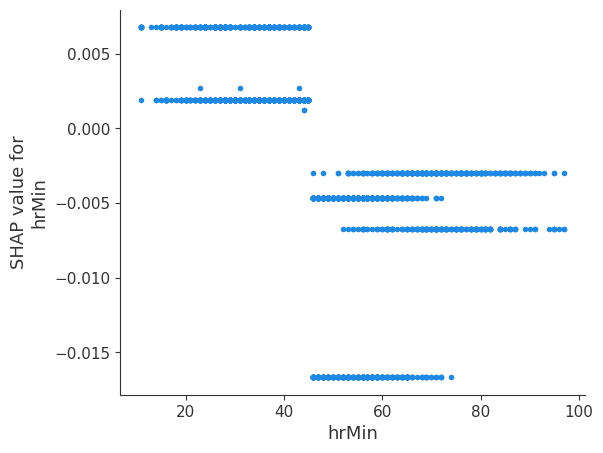

In [145]:
for index in df_test[features].columns:
    shap.dependence_plot(index, shap_values, df_test[features], interaction_index=None)

[Back to top](#top)


## 5.2 Feature Importance for Random Forest Classifier

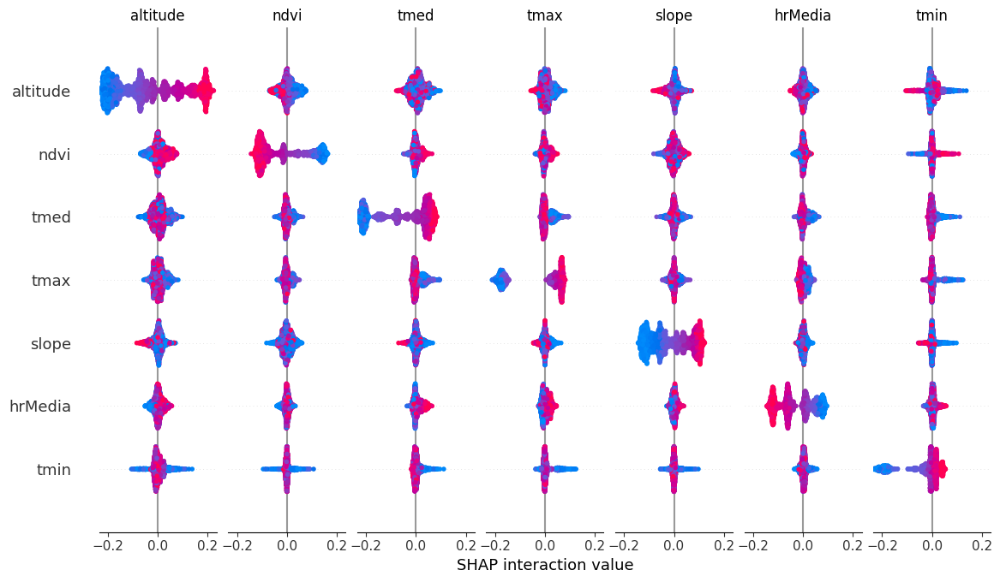

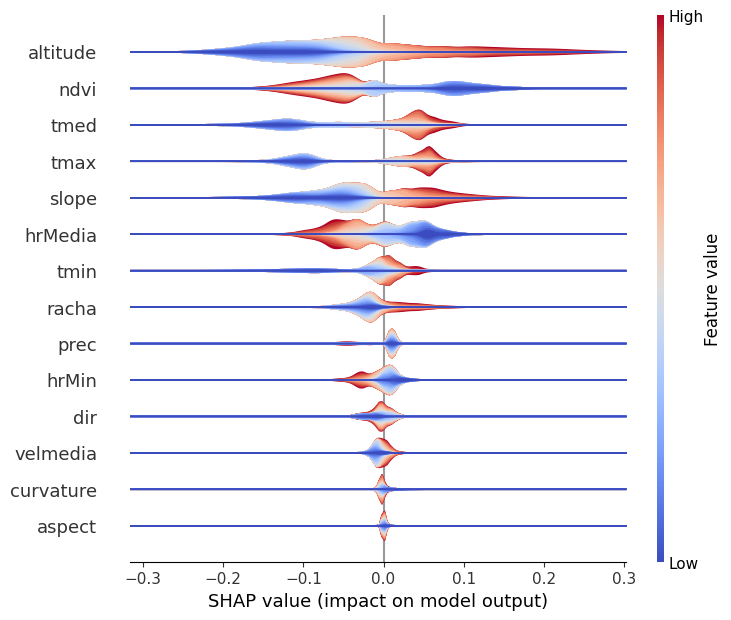

In [ ]:
import shap
explainer = shap.TreeExplainer(rfc_model)
shap_values = explainer.shap_values(df_test[features])
shap_interaction_values = explainer.shap_interaction_values(df_test[features])
shap.summary_plot(shap_interaction_values[:,:,:,1],df_test[features])
shap.plots.violin(shap_values[:,:,1], features=df_test[features], feature_names=df_test[features].columns, plot_type="layered_violin")

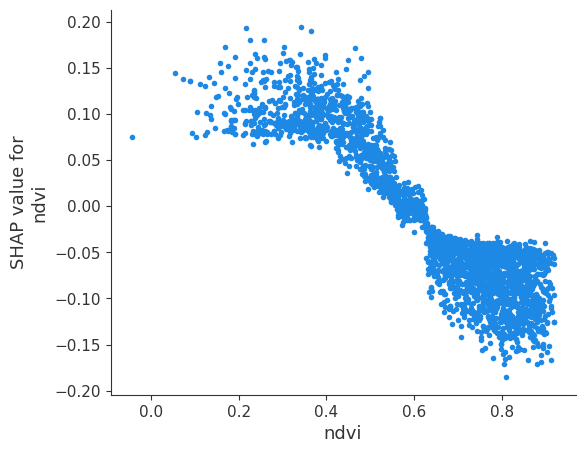

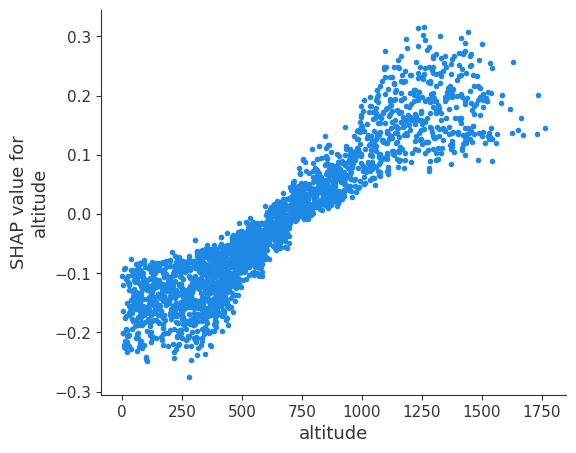

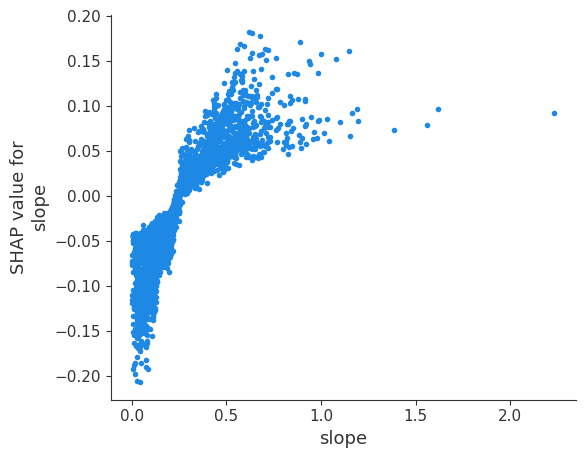

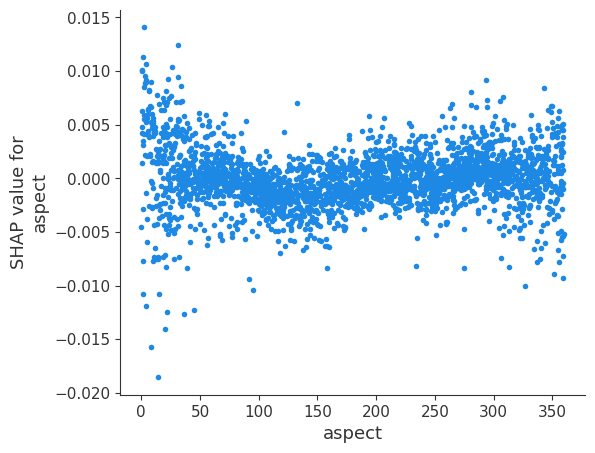

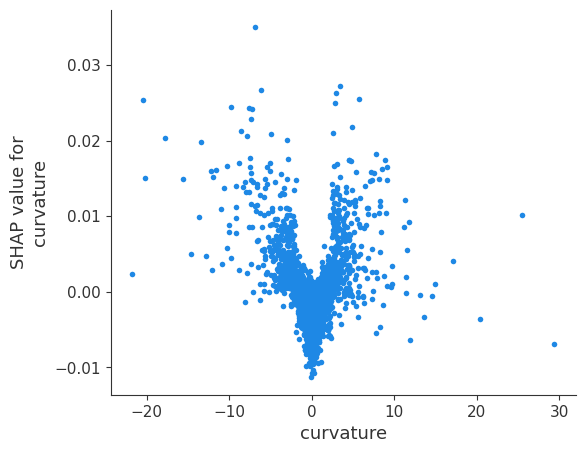

...

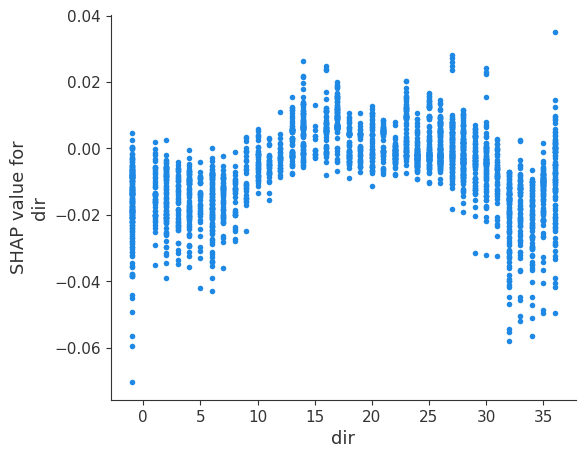

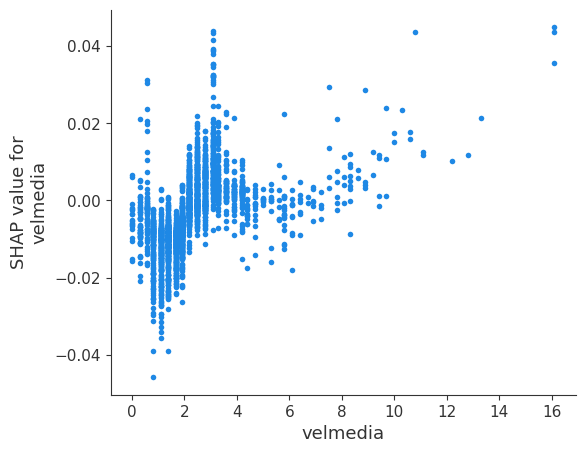

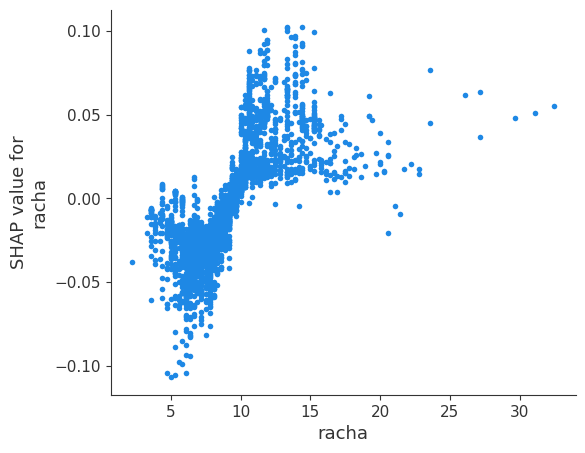

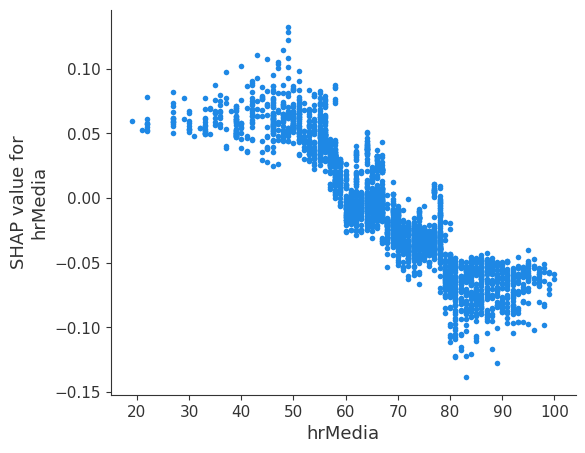

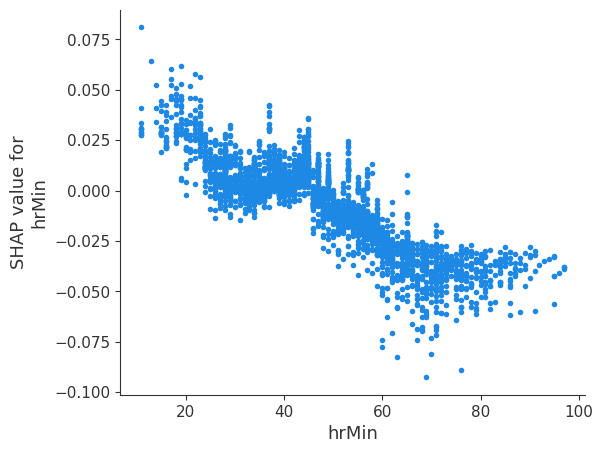

In [84]:
for index in df_test[features].columns:
    shap.dependence_plot(index, shap_values[:,:,1], df_test[features], interaction_index=None)